# Load Library

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from itertools import chain  # ✅ Required for multi_label_binary
import shap
import matplotlib.pyplot as plt


C:\Users\CTRL-SHIFT LTD\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Load Dataset

In [2]:

# Paths
women_path = r"D:\NISR\Microdata\csvfile\CFSVA2024_HH_WOMEN_15_49_YEARS.csv"
hh_path = r"D:\NISR\Microdata\csvfile\CFSVA2024_HH data.csv"
child_path = r"D:\NISR\Microdata\csvfile\CFSVA2024_HH_CHILD_6_59_MONTHS.csv"

# Load datasets
df_hh= pd.read_csv(hh_path)
women_df = pd.read_csv(women_path)
child_df = pd.read_csv(child_path)


C:\Users\CTRL-SHIFT LTD\AppData\Local\Temp\ipykernel_1500\2322818959.py:7: DtypeWarning: Columns (129,146,163,164,165,166,167,168,169,170,171,172,173,174,175,176,382,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,832,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006

### 🧾 Rename columns in `child_df` to readable labels
Mapping short variable codes to human-friendly labels for easier analysis.


In [3]:
variable_labels_short = {
    "index": "",
    "_parent_index": "",
    "S0_C_Prov": "Province",
    "S0_D_Dist": "District",
    "S13_01": "Child index",
    "S13_01_2": "Child name",
    "S13_01_3": "DOB",
    "S13_01_4": "Age (months)",
    "S13_01_5": "Sex",
    "S13_02": "Primary caregiver",
    "S13_03": "Relationship to child",
    "S13_04_01": "Chronic condition?",
    "S13_04_01_1": "Which conditions?",
    "S13_04_01_1_SMT_1": "Diabetes",
    "S13_04_01_1_SMT_2": "Cardiac disease",
    "S13_04_01_1_SMT_3": "Cancer",
    "S13_04_01_1_SMT_4": "Neuro disorders",
    "S13_04_01_1_SMT_5": "Obesity",
    "S13_04_01_1_SMT_6": "Lung disease",
    "S13_04_01_1_SMT_7": "Osteoarthritis",
    "S13_04_01_1_SMT_8": "Depression",
    "S13_04_01_1_SMT_9": "Dementia",
    "S13_04_01_1_SMT_21": "Other",
    "S13_05": "Present for interview?",
    "S13_06": "Birth weight (kg)",
    "S13_07": "Vit A last 6 months?",
    "S13_08": "Dewormed last 6 months?",
    "S13_09": "Fever last 2 weeks?",
    "S13_10": "Cough last 2 weeks?",
    "S13_11": "Diarrhea last 2 weeks?",
    "S13_11_2": "Diarrhea treatment",
    "S13_11_2_SMT_1": "More drinks",
    "S13_11_2_SMT_2": "More food",
    "S13_11_2_SMT_3": "More breastfeeding",
    "S13_11_2_SMT_4": "Safe water",
    "S13_11_2_SMT_5": "RUTF given",
    "S13_11_2_SMT_6": "ORS given",
    "S13_11_2_SMT_7": "Zinc supplement",
    "S13_11_2_SMT_8": "Other treatment",
    "S13_11_2_SMT_88": "No treatment",
    "S13_11_1": "Mouth illness last 2 weeks?",
    "S13_11_1_1_SMT_1": "Tooth pain",
    "S13_11_1_1_SMT_2": "Discolored teeth",
    "S13_11_1_1_SMT_3": "Crooked teeth",
    "S13_11_1_1_SMT_4": "Bad breath",
    "S13_11_1_1_SMT_5": "Bleeding gums",
    "S13_11_1_1_SMT_0": "Other mouth issue",
    "S13_12": "Saw health worker?",
    "S13_13": "Hands washed before meal?",
    "S13_13_1": "What used to wash hands?",
    "S13_14": "Slept under mosquito net?",
    "AS13_15": "Breastfed yesterday?",
    "AS13_15_2": "Ever breastfed?",
    "AS13_15_3": "Time to first breastfeed",
    "BS13_15": "Drank plain water?",
    "CS13_15": "Drank local drinks?",
    "CS13_15_2": "Infant formula times",
    "DS13_15": "Drank milk?",
    "DS13_15_2": "Milk consumption times",
    "ES13_15": "Drank juice/fruit drinks?",
    "FS13_15": "Drank clear broth?",
    "GS13_15": "Drank sour milk?",
    "HS13_15": "Drank fortified porridge?",
    "HS13_15_2": "FBF (shisha kibondo) times",
    "IS13_15": "Drank other FBF?",
    "JS13_15": "Drank thin porridge?",
    "KS13_15": "Drank tea or coffee?",
    "LS13_15": "Drank other water drink?",
    "MS13_15": "Drank from bottles?",
    "AS13_16": "Ate porridge/beans?",
    "BS13_16": "Ate white potatoes?",
    "BS13_16_1": "Ate fats/oils?",
    "CS13_16": "Ate legumes/nuts?",
    "DS13_16": "Ate milk/cheese/yogurt?",
    "ES13_16": "Ate organ meats?",
    "FS13_16": "Ate meat/fish?",
    "GS13_16": "Ate fresh/dried fruits?",
    "HS13_16": "Ate eggs?",
    "IS13_16": "Ate Vit A rich fruits/vegs?",
    "JS13_16": "Ate dark green vegs?",
    "KS13_16": "Ate ripe mango/papaya?",
    "LS13_16": "Ate other fruits?",
    "MS13_16": "Ate grain foods?",
    "NS13_16": "Ate shisha kibondo?",
    "OS13_16": "Ate other FBF?",
    "PS13_16": "Ate RUTF?",
    "QS13_16": "Ate bio-fortified foods?",
    "RS13_16_0": "Enrolled in Ongera MNP?",
    "RS13_16": "Ate Ongera foods?",
    "RS13_16_1": "Ongera food freq last 7 days",
    "S13_17": "Solid food frequency",
    "S13_18": "Enrolled in Shisha Kibondo?",
    "S13_19": "Enrolled in feeding program?",
    "S13_19_2": "Which feeding program?",
    "S13_20": "Has disability?",
    "S13_20_SMT_0": "None",
    "S13_20_SMT_1": "Can't measure edema",
    "S13_20_SMT_2": "Can't measure weight",
    "S13_20_SMT_3": "Can't measure height",
    "S13_20_SMT_4": "Can't measure MUAC",
    "muac": "MUAC child (mm)",
    "oedema": "Bilateral pitting edema?",
    "weight": "Weight (kg)",
    "height": "Height (cm)",
    "stunting": "Stunting status",
    "wasting": "Wasting status",
    "underweight": "Underweight status",
    "UrbanRural": "Urban or rural"
}

child_df.rename(columns=variable_labels_short, inplace=True)


### 🧾 Rename columns in `women_df` to readable labels
Mapping short variable codes to human-friendly labels for easier analysis.


In [4]:
name_to_label = {
    'S0_C_Prov': 'Province',
    'S0_D_Dist': 'District',
    'S12_01_3': "Woman's age",
    'S12_01_4': "Woman's literacy level",
    'S12_01_5': "Woman's education level",
    'S12_02': "Is woman currently present for interview?",
    'S12_03': "Are you currently using any contraceptive methods?",
    'S12_03_2': "Which method do you use?",
    'S12_03_3': "Specify other methods",
    'S12_04': "Have you ever been pregnant and given birth?",
    'S12_05': "Are you currently pregnant?",
    'S12_05_0': "Are you currently breastfeeding?",
    'S12_05_1': "Do you have a child growth card?",
    'S12_05_1_1': "If yes, is the card filled with some information?",
    'S12_05_1_2': "Who is in charge of this scorecard?",
    'S12_05_1_2_0': "Other (scorecard responsible)",
    'S12_05_1_3': "Does having this form help with child's growth?",
    'S12_05_2': "Enrolled in shisha kibondo / mubyeyi program?",
    'S12_06': "Visited by community health worker during last pregnancy?",
    'S12_07': "Seen anyone for child care in first 6 weeks?",
    'S12_08': "Seen anyone for antenatal care for recent pregnancy?",
    'S12_08_2': "Where did you receive antenatal care?",
    'S12_08_2_1': "Public health care provider",
    'S12_08_2_2': "Private health care provider",
    'S12_08_2_3': "Other ANC provider (specify)",
    'S12_08_3': "Months pregnant when you first received antenatal care",
    'S12_09': "Number of antenatal visits during recent pregnancy",
    'S12_10': "Did you take iron supplements during recent pregnancy?",
    'S12_10_0': "Which iron pill program are you enrolled in?",
    'S12_10_2': "How many iron pills did you take?",
    'S12_11': "Have you received any nutrition education or counselling?",
    'S12_11_2': "Who provided nutrition counselling?",
    'S12_11_2_1': "Health care worker (CHW)",
    'S12_11_2_2': "Health facility worker",
    'S12_11_2_3': "NGO worker",
    'S12_11_2_4': "Mothers in the community",
    'S12_11_2_5': "Local authorities",
    'S12_11_2_6': "Media (radio, TV, drama, etc.)",
    'S12_11_2_7': "Other channels",
    'S12_12': "Did you sleep under mosquito net last night?",
    'S12_14': "When do you wash hands?",
    'S12_14_1': "Before preparing meals",
    'S12_14_2': "After cleaning child from toilet",
    'S12_14_3': "Before eating",
    'S12_14_4': "Whenever hands are dirty",
    'S12_14_5': "After visiting toilet",
    'S12_14_6': "Other times",
    'S12_14_88': "Never wash hands",
    'S12_14_20': "Last time you washed hands, what did you use?",
    'S12_15': "Disability that prevents measurement?",
    'S12_16': "MUAC women in mm",
    'AS12_17': "Ate foods made from grains",
    'BS12_17': "Ate white roots/tubers/plantains",
    'CS12_17': "Ate pulses (beans, peas, lentils)",
    'DS12_17': "Ate nuts and seeds",
    'ES12_17': "Ate milk and dairy products",
    'GS12_17': "Ate organ meat",
    'HS12_17': "Ate meat and poultry",
    'IS12_17': "Ate fish and seafood",
    'JS12_17': "Ate eggs",
    'KS12_17': "Ate dark green leafy vegetables",
    'LS12_17': "Ate Vitamin A-rich vegetables, roots, tubers",
    'MS12_17': "Ate Vitamin A-rich fruits (e.g., mango, papaya)",
    'NS12_17': "Ate other vegetables",
    'OS12_17': "Ate other fruits",
    'PS12_17': "Ate Shisha Kibondo / Mubyeyi",
    'QS12_17': "Ate fortified blended foods (Nootri mama, etc.)",
    'MDDWLess5': "Minimum Dietary Diversity - Women",
}

women_df.rename(columns=name_to_label, inplace=True)


### ✅ Keep relevant columns for Hidden Hunger analysis and rename them for clarity from  household dataset

In [5]:
import pandas as pd

# List of variables most relevant for "Ending Hidden Hunger"
relevant_hh_vars = [
    # Geospatial
    '___index','S0_C_Prov', 'S0_D_Dist', 'UrbanRural',
    # Housing
    #'S2_01', 'S2_02', 'S2_03',

    # Demographics
    'S1_01', 'active_members', 'inactive_members', 'Total_disbled','S1_01_10' , #,'S9_01_3_SMT_7'
    'HH_member_has_disability', 'S1_01_3', 'S1_01_4', 'S1_01_7', 'S1_01_8', 'S1_01_9','Active_and_Work_and_contribute','contributing_ratio',

    # Food security & consumption
    'S9_01', 'S9_01_2', 'S10_01', 'S10_03', 'AS10_05', 'AS10_05_6',
    'AS8_03', 'BS8_03', 'DS8_03', 'ES8_03', 'FS8_03', 'GS8_03', 'HS8_03', 'IS8_03','FS_final',

    # Food expenditures
    'S7_01_01', 'S7_01_02', 'S7_01_03', 'S7_01_04', 'S7_01_05', 'S7_01_06', 'S7_01_07',

    # WASH
    'S2_07', 'S2_10', 'S2_10_4', 'S2_12', 'S2_13',

    # Agriculture & crops
    'S4_01', 'S4_03', 'S4_03_2', 'S4_03_3',
    'S5_01_SMT_20', 'S5_01_SMT_50', 'S5_01_SMT_51', 'S5_01_SMT_52', 'S5_01_SMT_54',

    # Livestock
    'S4_05_SMT_1', 'S4_05_SMT_2', 'S4_05_SMT_3', 'S4_05_SMT_4', 'S4_07',

    # Education
    'S1_01_12', 'S1_01_13', 'S1_01_14_SMT_6', 'S1_01_14_SMT_9',

    # Metadata
    'S0_B_DATE', 'FinalWeight', 'WI_cat'
]

# Mapping of variable codes to human-readable labels
variable_labels = {
    '___index':'index',
    'S0_C_Prov': 'Province',
    'S0_D_Dist': 'District',
    'UrbanRural': 'Urban or Rural',
    'S1_01': 'Household Size',
    'active_members': 'Active Members',
    'inactive_members': 'Inactive Members',
    'Total_disbled': 'Disabled Members',
    'HH_member_has_disability': 'Any Disability in HH',
    'S1_01_3': 'HH Head Gender',
    'S1_01_4': 'HH Head Age',
    'S1_01_7': 'HH Head Literacy',
    'S1_01_8': 'HH Head Education',
    'S1_01_9': 'HH Head Disability',
    'S3_01': 'All income-generating activities',
    'S3_02': 'Main livelihood activity',
    'S3_05': 'Monthly income earned',
    'Active_and_Work_and_contribute': 'Active, working, and contributing',
    'contributing_ratio': 'Contribution ratio',
    'S1_01_10' : '[HH Head] marital status' ,
    'S1_01_11': 'number of spouses or partners for [HH Head]' ,
    #'S9_01_3_SMT_7':'Support in health insurance',

    
    # Food security
    'S9_01': 'Food Shortage (7 days)',
    'S9_01_2': 'Reason for Food Shortage',
    'S10_01': 'Months Food Shortage (12 months)',
    'S10_03': 'Shocks in Past Year',
    'AS10_05': 'Most Severe Shock',
    'AS10_05_6': 'Coping Strategies for Shock',
    'FS_final':	'Household food security',

    # Food frequency
    'AS8_03': 'Cereals/Tubers (7d)',
    'BS8_03': 'Orange Sweet Potatoes (7d)',
    'DS8_03': 'Legumes/Nuts (7d)',
    'ES8_03': 'Bio-fortified Beans (7d)',
    'FS8_03': 'Dairy (7d)',
    'GS8_03': 'Meat/Fish/Eggs (7d)',
    'HS8_03': 'Vegetables (7d)',
    'IS8_03': 'Fruits (7d)',

    # Expenditures
    'S7_01_01': 'Spend on Cereals',
    'S7_01_02': 'Spend on Vegetables',
    'S7_01_03': 'Spend on Fruits',
    'S7_01_04': 'Spend on Protein (Meat/Fish/Eggs)',
    'S7_01_05': 'Spend on Dairy',
    'S7_01_06': 'Spend on Fats/Oils',
    'S7_01_07': 'Spend on Sweets',

    # WASH
    'S2_07': 'Toilet Facility',
    'S2_10': 'Main Water Source',
    'S2_10_4': 'Time to Fetch Water (min)',
    'S2_12': 'Water Treatment',
    'S2_13': 'Water Usage (liters/day)',

    # Agriculture
    'S4_01': 'Owns Farming Land',
    'S4_03': 'Has Vegetable Garden',
    'S4_03_2': 'Currently Growing Food',
    'S4_03_3': 'Garden Food for Own Use',
    'S5_01_SMT_20': 'Grows Orange Sweet Potato',
    'S5_01_SMT_50': 'Grows Bio-fortified Beans',
    'S5_01_SMT_51': 'Grows Beans',
    'S5_01_SMT_52': 'Grows Peas',
    'S5_01_SMT_54': 'Grows Groundnuts',

    # Livestock
    'S4_05_SMT_1': 'Owns Cattle',
    'S4_05_SMT_2': 'Owns Goats',
    'S4_05_SMT_3': 'Owns Pigs',
    'S4_05_SMT_4': 'Owns Chickens',
    'S4_07': 'Consumes Livestock Products',

    # Education
    'S1_01_12': 'HH Head in School',
    'S1_01_13': 'Missed School ≥1 Week',
    'S1_01_14_SMT_6': 'Missed School: Fees',
    'S1_01_14_SMT_9': 'Missed School: Materials',

    # Metadata
    'S0_B_DATE': 'Interview Date',
    'FinalWeight': 'Survey Weight',
    'WI_cat': 'Household wealth index'
}

# Filter the DataFrame to keep only the relevant columns that exist
hh_columns_present = [col for col in relevant_hh_vars if col in df_hh.columns]
df_hh_relevant = df_hh[hh_columns_present].copy()

# Rename the columns using labels
df_hh_relevant = df_hh_relevant.rename(columns=variable_labels)




In [6]:
for col in df_hh_relevant.columns:
    print(f"\n🔹 Column: {col}")
    print(f"Unique values ({df_hh_relevant[col].nunique()}):")
    print(df_hh_relevant[col].unique())


🔹 Column: index
Unique values (9000):
[4164 4166 4196 ... 2857 2856 2849]

🔹 Column: Province
Unique values (5):
['Kigali city' 'Southern' 'Western' 'Northern' 'Eastern']

🔹 Column: District
Unique values (30):
['Nyarugenge' 'Gasabo' 'Kicukiro' 'Nyanza' 'Gisagara' 'Nyaruguru' 'Huye'
 'Nyamagabe' 'Ruhango' 'Muhanga' 'Kamonyi' 'Karongi' 'Rutsiro' 'Rubavu'
 'Nyabihu' 'Ngororero' 'Rusizi' 'Nyamasheke' 'Rulindo' 'Gakenke' 'Musanze'
 'Burera' 'Gicumbi' 'Rwamagana' 'Nyagatare' 'Gatsibo' 'Kayonza' 'Kirehe'
 'Ngoma' 'Bugesera']

🔹 Column: Urban or Rural
Unique values (2):
['Urban' 'Rural']

🔹 Column: Household Size
Unique values (15):
[ 2  6  5  3  4  1  7 10  9  8 11 14 12 16 13]

🔹 Column: Active Members
Unique values (11):
[ 2  4  3  1  0  5  7  6  8 10  9]

🔹 Column: Inactive Members
Unique values (11):
[ 0  2  1  3  4  7  6  5  9  8 10]

🔹 Column: Disabled Members
Unique values (5):
[0 1 2 3 5]

🔹 Column: [HH Head] marital status
Unique values (6):
['Never married (single)' 'Widow/Widower

### 🔧 Clean and standardize household data:
- Format categorical variables (e.g., province, education)
- Check consistency in disability and household member counts
- Clean spending values (remove text, convert to float)
- Standardize shock-related responses (title case, handle missing)


In [7]:

# Standardize Categorical Columns
cat_cols_hh = [
    'Province', 'District', 'Urban or Rural', 'HH Head Gender',
    'HH Head Literacy', 'HH Head Education', 'Toilet Facility'
]
df_hh_relevant[cat_cols_hh] = df_hh_relevant[cat_cols_hh].apply(
    lambda col: col.astype(str).str.strip().str.title()
)

# Consistency Checks
df_hh_relevant['Disability Check'] = np.where(
    (df_hh_relevant['Disabled Members'] > 0) & (df_hh_relevant['Any Disability in HH'].str.lower() == 'no'),
    'Inconsistent', 'OK'
)

df_hh_relevant['Member Count Check'] = np.where(
    df_hh_relevant['Household Size'] >= (df_hh_relevant['Active Members'] + df_hh_relevant['Inactive Members']),
    'OK', 'Mismatch'
)

# Clean Spending Columns
spending_cols = [
    'Spend on Cereals', 'Spend on Vegetables', 'Spend on Fruits',
    'Spend on Protein (Meat/Fish/Eggs)', 'Spend on Dairy',
    'Spend on Fats/Oils', 'Spend on Sweets'
]
df_hh_relevant[spending_cols] = df_hh_relevant[spending_cols].apply(
    lambda col: (
        col.astype(str)
           .replace({',': '', 'UGX': ''}, regex=True)
           .str.extract(r'(\d+\.?\d*)')[0]
           .astype(float)
    )
)

# Clean Shock-Related Columns
shock_cols = [
    'Shocks in Past Year', 'Most Severe Shock', 'Coping Strategies for Shock'
]
df_hh_relevant[shock_cols] = df_hh_relevant[shock_cols].apply(
    lambda col: (
        col.astype(str)
           .str.strip()
           .str.title()
           .replace({'Nan': 'None', 'Na': 'None'})
           .replace(r'\s{2,}', ' ', regex=True)
    )
)

In [8]:
for col in women_df.columns:
    print(f"\n🔹 Column: {col}")
    print(f"Unique values ({women_df[col].nunique()}):")
    print(women_df[col].unique())


🔹 Column: ___index
Unique values (5992):
[   4    5    6 ... 8998 8999 9000]

🔹 Column: Province
Unique values (5):
['Estern Province' 'City of Kigali' 'Southern Province'
 'Northern Province' 'Western Province']

🔹 Column: District
Unique values (30):
['Gatsibo' 'Kicukiro' 'Nyanza' 'Bugesera' 'Gisagara' 'Musanze' 'Rusizi'
 'Nyaruguru' 'Rulindo' 'Huye' 'Kamonyi' 'Karongi' 'Rutsiro' 'Nyamagabe'
 'Muhanga' 'Kirehe' 'Ruhango' 'Burera' 'Rwamagana' 'Gicumbi' 'Nyarugenge'
 'Rubavu' 'Nyabihu' 'Ngororero' 'Nyagatare' 'Kayonza' 'Nyamasheke' 'Ngoma'
 'Gakenke' 'Gasabo']

🔹 Column: Woman's age
Unique values (35):
[28 35 33 40 19 23 20 31 24 30 17 27 49 18 34 26 37 41 43 16 22 45 44 36
 32 42 25 46 15 39 29 38 21 48 47]

🔹 Column: Woman's literacy level
Unique values (3):
['Yes (read only)' 'Yes (both read and write)' 'No']

🔹 Column: Woman's education level
Unique values (9):
['Some/still primary' 'Completed primary' 'Some/still secondary'
 'Some/still university' 'Completed secondary' 'No schoo

### 🔧 Clean and standardize women data:
- Convert ANC visit counts to numeric and set invalid codes as missing
- Create binary columns for each ANC care location from multi-select responses
- Replace blank strings with NaN across all columns


In [9]:
# Convert ANC visits to numeric and handle invalid values
invalid_values = [77, 88, 99]
women_df['Number of antenatal visits during recent pregnancy'] = pd.to_numeric(
    women_df['Number of antenatal visits during recent pregnancy'], errors='coerce'
)
women_df.loc[
    women_df['Number of antenatal visits during recent pregnancy'].isin(invalid_values),
    'Number of antenatal visits during recent pregnancy'
] = np.nan

# Split multiple ANC response options into binary columns
women_df['Where did you receive antenatal care?'] = women_df['Where did you receive antenatal care?'].astype(str)
for val in ['1', '2', '3']:
    women_df[f'ANC_place_{val}'] = women_df['Where did you receive antenatal care?'].str.contains(val).astype(int)

# Replace blank strings across all columns with NaN
women_df.replace(r'^\s*$', np.nan, regex=True, inplace=True)


### 🧼 Clean child-level data:
- Drop columns with only one unique value
- Replace blanks and placeholder codes with NaN & Fix known typos in province names
- Convert date of birth to datetime format & Convert anthropometric measurements to numeric


In [10]:
# Drop columns with only one unique value
child_df.drop(columns=[col for col in child_df.columns if child_df[col].nunique() <= 1], inplace=True)

# Replace blanks and placeholders
child_df.replace(['', ' ', '77', '88'], np.nan, inplace=True)
child_df = child_df.infer_objects(copy=False)  # Avoid type warnings

# Fix known typos
child_df['Province'] = child_df['Province'].replace({'Estern': 'Eastern'})

# Convert DOB to datetime
child_df['DOB'] = pd.to_datetime(child_df['DOB'], errors='coerce')

# Convert measurement fields to numeric
measurement_cols = ['Weight (kg)', 'Height (cm)', 'MUAC child (mm)']
child_df[measurement_cols] = child_df[measurement_cols].apply(
    lambda col: pd.to_numeric(col, errors='coerce')
)


C:\Users\CTRL-SHIFT LTD\AppData\Local\Temp\ipykernel_1500\84778665.py:12: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  child_df['DOB'] = pd.to_datetime(child_df['DOB'], errors='coerce')


### 📋 Summarize missing data in a DataFrame of child, women and household dataset:
Returns a table showing count and percentage of missing values per column.


In [11]:
import pandas as pd

def summarize_missing(df, df_name='DataFrame'):
    """Return a summary DataFrame of missing counts and percentages."""
    missing_counts = df.isna().sum()
    missing_percent = (missing_counts / len(df) * 100).round(2)
    
    summary_df = pd.DataFrame({
        'Missing Count': missing_counts,
        'Missing %': missing_percent
    }).sort_values(by='Missing Count', ascending=False)
    
    summary_df = summary_df[summary_df['Missing Count'] > 0]
    summary_df.index.name = f'{df_name} Columns'
    
    return summary_df


In [12]:
# Get missing data summaries
missing_women = summarize_missing(women_df, 'Women')
missing_household = summarize_missing(df_hh_relevant, 'Household')
missing_child = summarize_missing(child_df, 'Child')

# display all rows
pd.set_option('display.max_rows', None)

# Print or inspect the results
print("\n🔎 Missing Data in Household Dataset:\n", missing_household)



🔎 Missing Data in Household Dataset:
                              Missing Count  Missing %
Household Columns                                    
Missed School: Materials              9000     100.00
Missed School: Fees                   9000     100.00
Missed School ≥1 Week                 9000     100.00
HH Head in School                     9000     100.00
Reason for Food Shortage              5181      57.57
Garden Food for Own Use               4264      47.38
Currently Growing Food                4264      47.38
Consumes Livestock Products           3883      43.14
Grows Groundnuts                      3007      33.41
Grows Orange Sweet Potato             3007      33.41
Grows Bio-fortified Beans             3007      33.41
Grows Beans                           3007      33.41
Grows Peas                            3007      33.41
Time to Fetch Water (min)             1508      16.76
Contribution ratio                     624       6.93


### 🧹 Household Data Cleaning & Imputation:
- Drop fully missing columns and irrelevant features  
- Impute key food production and consumption variables using related indicators  
- Fill missing numeric fields (water fetch time, contribution ratio) with district medians  
- Summarize remaining missing data for review


In [13]:
# # 🔹 1. Drop Fully Missing Columns
# -------------------------------
cols_to_drop = [
    'Missed School: Materials',
    'HH Head in School',
    'Missed School ≥1 Week',
    'Missed School: Fees',
    'Coping Strategies for Shock'  # Optional if truly 100% missing
]
df_hh_relevant.drop(columns=[col for col in cols_to_drop if col in df_hh_relevant.columns], inplace=True)

# -------------------------------
# 🔹 2. Handle "Currently Growing Food"
# -------------------------------
crop_cols = [
    'Grows Beans', 'Grows Peas', 'Grows Groundnuts',
    'Grows Bio-fortified Beans', 'Grows Orange Sweet Potato'
]

# Define growing conditions
growing_proxy = (
    (df_hh_relevant['Owns Farming Land'] == 'Yes') |
    (df_hh_relevant['Has Vegetable Garden'] == 'Yes') |
    (df_hh_relevant[crop_cols] == 'Yes').any(axis=1)
)
df_hh_relevant.loc[df_hh_relevant['Currently Growing Food'].isna() & growing_proxy, 'Currently Growing Food'] = 'Yes'

not_growing_proxy = (
    (df_hh_relevant['Owns Farming Land'] == 'No') &
    (df_hh_relevant['Has Vegetable Garden'] == 'No') &
    (df_hh_relevant[crop_cols] == 'No').all(axis=1)
)
df_hh_relevant.loc[df_hh_relevant['Currently Growing Food'].isna() & not_growing_proxy, 'Currently Growing Food'] = 'No'

df_hh_relevant['Currently Growing Food'].fillna('Unknown', inplace=True)

# -------------------------------
# 🔹 3. Reason for Food Shortage
# -------------------------------
df_hh_relevant.loc[
    (df_hh_relevant['Food Shortage (7 days)'] == 'No') &
    (df_hh_relevant['Reason for Food Shortage'].isna()),
    'Reason for Food Shortage'
] = 'No Shortage'

df_hh_relevant['Reason for Food Shortage'].fillna('Unknown', inplace=True)

# -------------------------------
# 🔹 4. Garden Food for Own Use
# -------------------------------
df_hh_relevant.loc[
    (df_hh_relevant['Garden Food for Own Use'].isna()) &
    (df_hh_relevant['Has Vegetable Garden'] == 'Yes') &
    (df_hh_relevant['Currently Growing Food'] == 'Yes'),
    'Garden Food for Own Use'
] = 'Yes'

df_hh_relevant.loc[
    (df_hh_relevant['Garden Food for Own Use'].isna()) &
    ((df_hh_relevant['Has Vegetable Garden'] == 'No') |
     (df_hh_relevant['Currently Growing Food'] == 'No')),
    'Garden Food for Own Use'
] = 'No'

# Uncomment below if you want to fill remaining with 'Unknown'
# df_hh_relevant['Garden Food for Own Use'].fillna('Unknown', inplace=True)

# -------------------------------
# 🔹 5. Consumes Livestock Products
# -------------------------------
livestock_cols = ['Owns Cattle', 'Owns Goats', 'Owns Pigs', 'Owns Chickens']

df_hh_relevant[livestock_cols] = df_hh_relevant[livestock_cols].apply(
    lambda col: col.astype(str).str.strip().str.capitalize()
)

owns_livestock = (df_hh_relevant[livestock_cols] == 'Yes').any(axis=1)
no_livestock = (df_hh_relevant[livestock_cols] == 'No').all(axis=1)

df_hh_relevant.loc[
    df_hh_relevant['Consumes Livestock Products'].isna() & owns_livestock,
    'Consumes Livestock Products'
] = 'Yes'

df_hh_relevant.loc[
    df_hh_relevant['Consumes Livestock Products'].isna() & no_livestock,
    'Consumes Livestock Products'
] = 'No'

# Optional fallback
# df_hh_relevant['Consumes Livestock Products'] = df_hh_relevant['Consumes Livestock Products'].fillna('Unknown')

# -------------------------------
# 🔹 6. Crop Columns Imputation
# -------------------------------
crop_cols_to_clean = [
    'Grows Groundnuts', 'Grows Bio-fortified Beans',
    'Grows Beans', 'Grows Peas', 'Grows Orange Sweet Potato'
]

df_hh_relevant[crop_cols_to_clean] = df_hh_relevant[crop_cols_to_clean].apply(
    lambda col: col.astype(str).str.strip().str.capitalize()
)

not_growing = (
    (df_hh_relevant['Currently Growing Food'] == 'No') &
    (df_hh_relevant['Owns Farming Land'] == 'No')
)

for col in crop_cols_to_clean:
    df_hh_relevant.loc[df_hh_relevant[col].isna() & not_growing, col] = 'No'
    df_hh_relevant[col] = df_hh_relevant[col].fillna('Unknown')

# Make sure to avoid inplace on slice warnings:
df_hh_relevant['Currently Growing Food'] = df_hh_relevant['Currently Growing Food'].fillna('Unknown')
df_hh_relevant['Reason for Food Shortage'] = df_hh_relevant['Reason for Food Shortage'].fillna('Unknown')

# -------------------------------
# 🔹 7. Time to Fetch Water (Numerical)
# -------------------------------
df_hh_relevant['Time to Fetch Water (min)'] = df_hh_relevant.groupby('District')['Time to Fetch Water (min)']\
    .transform(lambda x: x.fillna(x.median()))

df_hh_relevant['Time to Fetch Water (min)'] = df_hh_relevant['Time to Fetch Water (min)']\
    .fillna(df_hh_relevant['Time to Fetch Water (min)'].median())

# First try impute by District
df_hh_relevant['Contribution ratio'] = df_hh_relevant.groupby('District')['Contribution ratio']\
    .transform(lambda x: x.fillna(x.median()))

# Final fallback
df_hh_relevant['Contribution ratio'] = df_hh_relevant['Contribution ratio'].fillna(
    df_hh_relevant['Contribution ratio'].median()
)


# -------------------------------
# 🔹 8. Final Missing Summary
# -------------------------------
missing_household = summarize_missing(df_hh_relevant, 'Household')
pd.set_option('display.max_rows', None)
print("\n🔍 Remaining Missing Values in Household Dataset:\n", missing_household)


🔍 Remaining Missing Values in Household Dataset:
 Empty DataFrame
Columns: [Missing Count, Missing %]
Index: []


C:\Users\CTRL-SHIFT LTD\AppData\Local\Temp\ipykernel_1500\580007655.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_hh_relevant['Currently Growing Food'].fillna('Unknown', inplace=True)
C:\Users\CTRL-SHIFT LTD\AppData\Local\Temp\ipykernel_1500\580007655.py:46: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting v

In [14]:
print("🔎 Missing Data in Women Dataset:\n", missing_women)


🔎 Missing Data in Women Dataset:
                                                     Missing Count  Missing %
Women Columns                                                               
Specify other methods                                        6884      99.90
Other (scorecard responsible)                                6875      99.77
If yes, is the card filled with some information?            6610      95.92
Who is in charge of this scorecard?                          6610      95.92
Does having this form help with child's growth?              6610      95.92
Do you have a child growth card?                             5248      76.16
Enrolled in shisha kibondo / mubyeyi program?                4428      64.26
Seen anyone for child care in first 6 weeks?                 4428      64.26
NGO worker                                                   3601      52.26
Health facility worker                                       3601      52.26
Health care worker (CHW)                  

### 🧹 Women Data Cleaning & Imputation:
- Drop fully missing or irrelevant columns  
- Impute minimal missing numeric and categorical fields with medians or "Unknown"  
- Mark pregnancy-related and nutrition counselling fields as "Not applicable" based on survey logic  
- Fill remaining missing categorical values with "Unknown" for clarity  
- Summarize remaining missing data for review


In [15]:
import pandas as pd

# -------------------------------
# 🔹 Drop Completely Missing Columns
# -------------------------------
cols_to_drop = [
    'Specify other methods',
    'Other (scorecard responsible)',
    'If yes, is the card filled with some information?',
    'Who is in charge of this scorecard?',
    "Does having this form help with child's growth?"
]
women_df.drop(columns=cols_to_drop, inplace=True)

# -------------------------------
# 🔹 Handle Minimal Missingness (<5%)
# -------------------------------
# Numeric
women_df['MUAC women in mm'] = women_df['MUAC women in mm'].fillna(women_df['MUAC women in mm'].median())

# Categorical
women_df['Last time you washed hands, what did you use?'] = women_df[
    'Last time you washed hands, what did you use?'
].fillna('Unknown')

# -------------------------------
# 🔹 Define Column Groups
# -------------------------------
pregnancy_related_cols = [
    'Do you have a child growth card?',
    'Enrolled in shisha kibondo / mubyeyi program?',
    'Seen anyone for child care in first 6 weeks?',
    'Where did you receive antenatal care?',
    'Number of antenatal visits during recent pregnancy',
    'Which iron pill program are you enrolled in?',
    'Which method do you use?',
    'How many iron pills did you take?',
    'Months pregnant when you first received antenatal care',
    'Did you take iron supplements during recent pregnancy?',
    'Seen anyone for antenatal care for recent pregnancy?',
    'Are you currently breastfeeding?',
    'Visited by community health worker during last pregnancy?'
]

ever_pregnant_col = 'Have you ever been pregnant and given birth?'
currently_pregnant_col = 'Are you currently pregnant?'
currently_using_contra_col = 'Are you currently using any contraceptive methods?'
which_method_col = 'Which method do you use?'

# Convert to object dtype
for col in pregnancy_related_cols:
    women_df[col] = women_df[col].astype('object')

# -------------------------------
# 🧩 1. If Never Pregnant → Not Applicable
# -------------------------------
for col in pregnancy_related_cols:
    mask_never = (women_df[ever_pregnant_col] == 'No') & (women_df[col].isna())
    women_df.loc[mask_never, col] = 'Not applicable'

# -------------------------------
# 🧩 2. If Not Using Contraceptives → Not Applicable
# -------------------------------
mask_no_contra = (women_df[currently_using_contra_col] == 'No') & (women_df[which_method_col].isna())
women_df.loc[mask_no_contra, which_method_col] = 'Not applicable'

# -------------------------------
# 🧩 3. If Not Currently Pregnant → Not Applicable
# -------------------------------
for col in pregnancy_related_cols:
    mask_not_preg = (women_df[currently_pregnant_col] == 'No') & (women_df[col].isna())
    women_df.loc[mask_not_preg, col] = 'Not applicable'

# -------------------------------
# 🧩 4. Remaining Pregnancy-related → Unknown
# -------------------------------
for col in pregnancy_related_cols:
    women_df[col] = women_df[col].fillna('Unknown')

# -------------------------------
# 🔹 Nutrition Counselling-Related
# -------------------------------
nutrition_related_cols = [
    'Who provided nutrition counselling?',
    'Health care worker (CHW)',
    'Health facility worker',
    'NGO worker',
    'Mothers in the community',
    'Local authorities',
    'Media (radio, TV, drama, etc.)',
    'Other channels'
]

nutrition_gateway = 'Have you received any nutrition education or counselling?'

for col in nutrition_related_cols:
    women_df[col] = women_df[col].astype('object')

    # Not applicable if didn't receive
    mask_no_nutrition = (women_df[nutrition_gateway] == 'No') & (women_df[col].isna())
    women_df.loc[mask_no_nutrition, col] = 'Not applicable'

    # Remaining missing = Unknown
    women_df[col] = women_df[col].fillna('Unknown')

# -------------------------------
# 🔹 ANC Provider-Related
# -------------------------------
anc_provider_cols = [
    'Private health care provider',
    'Public health care provider',
    'Other ANC provider (specify)'
]
anc_gateway = 'Seen anyone for antenatal care for recent pregnancy?'

for col in anc_provider_cols:
    women_df[col] = women_df[col].astype('object')

    mask_no_anc = (women_df[anc_gateway] == 'No') & (women_df[col].isna())
    women_df.loc[mask_no_anc, col] = 'Not applicable'

    women_df[col] = women_df[col].fillna('Unknown')

# -------------------------------
# 🔹 Currently Pregnant Fallback
# -------------------------------
preg_col = 'Are you currently pregnant?'
women_df[preg_col] = women_df[preg_col].fillna('Unknown')



missing_women = summarize_missing(women_df, 'Household')
pd.set_option('display.max_rows', None)
print("\n🔍 Remaining Missing Values in Household Dataset:\n", missing_women)



🔍 Remaining Missing Values in Household Dataset:
 Empty DataFrame
Columns: [Missing Count, Missing %]
Index: []


In [16]:
print("\n🔎 Missing Data in Child Dataset:\n", missing_child)



🔎 Missing Data in Child Dataset:
                               Missing Count  Missing %
Child Columns                                         
Which conditions?                      4678      99.22
Diabetes                               4678      99.22
Cardiac disease                        4678      99.22
Neuro disorders                        4678      99.22
Lung disease                           4678      99.22
Other                                  4678      99.22
Infant formula times                   4677      99.19
Ongera food freq last 7 days           4611      97.79
Ever breastfed?                        4605      97.67
Which feeding program?                 4571      96.95
Tooth pain                             4541      96.31
Other mouth issue                      4541      96.31
Bleeding gums                          4541      96.31
Bad breath                             4541      96.31
Crooked teeth                          4541      96.31
Discolored teeth              

### 🧹 Child Data Cleaning & Imputation:
- Drop irrelevant or mostly missing columns, and fill categorical fields with "Don't know", "Not applicable", or "Missing" as appropriate  
- Replace unrealistic values and impute numeric variables (e.g., weight, height, MUAC, solid food frequency) using grouped medians by age, sex, district  
- Fill binary and status columns with default values (e.g., "No", "Normal") and impute categorical modes by subgroup  
- Drop rows missing critical measurements and clean special cases like disability indicators for consistency  


In [17]:
import pandas as pd

# === Step 1: Drop columns with extremely high missingness or irrelevant ===
cols_to_drop = [
    "Bad breath", "Bleeding gums", "Cancer", "Cardiac disease", "Crooked teeth",
    "Dementia", "Depression", "Diabetes", "Discolored teeth", "Ever breastfed?",
    "FBF (shisha kibondo) times", "Infant formula times", "Lung disease",
    "Milk consumption times", "Neuro disorders", "Obesity", "Ongera food freq last 7 days",
    "Osteoarthritis", "Other", "Other mouth issue", "Tooth pain", "Slept under mosquito net?",
    "Which feeding program?", "Which conditions?"
]

# Drop only columns that actually exist in the dataframe
cols_to_drop_filtered = [col for col in cols_to_drop if col in child_df.columns]
child_df_cleaned = child_df.drop(columns=cols_to_drop_filtered)

print(f"Dropped columns: {set(cols_to_drop) - set(cols_to_drop_filtered)}")
print("Remaining columns:", child_df_cleaned.columns.tolist())

# === Step 2: Fill categorical columns with "Don't know" where appropriate ===
dont_know_columns = [
    'Vit A last 6 months?', 'Dewormed last 6 months?', 'Fever last 2 weeks?',
    'Cough last 2 weeks?', 'Diarrhea last 2 weeks?', 'Mouth illness last 2 weeks?',
    'Hands washed before meal?', 'Drank plain water?', 'Drank milk?', 'Drank clear broth?',
    'Drank fortified porridge?', 'Drank thin porridge?', 'Drank tea or coffee?', 'Drank from bottles?',
    'Ate porridge/beans?', 'Ate white potatoes?', 'Ate fats/oils?', 'Ate legumes/nuts?',
    'Ate milk/cheese/yogurt?', 'Ate organ meats?', 'Ate meat/fish?', 'Ate fresh/dried fruits?',
    'Ate eggs?', 'Ate Vit A rich fruits/vegs?', 'Ate dark green vegs?', 'Ate ripe mango/papaya?',
    'Ate other fruits?', 'Ate grain foods?', 'Ate shisha kibondo?', 'Ate other FBF?',
    'Ate RUTF?', 'Ate bio-fortified foods?', 'Enrolled in Ongera MNP?', 'Ate Ongera foods?',
    'Enrolled in Shisha Kibondo?', 'Enrolled in feeding program?'
]

child_df_cleaned[dont_know_columns] = child_df_cleaned[dont_know_columns].fillna("Don't know")

# Specific special case for time to first breastfeed
child_df_cleaned['Time to first breastfeed'] = child_df_cleaned['Time to first breastfeed'].fillna("Don't remember")

# === Step 3: Fill columns missing by design when child didn't have diarrhea ===
diarrhea_related_cols = [
    'More drinks', 'Zinc supplement', 'More food', 'More breastfeeding', 'Safe water',
    'RUTF given', 'Other treatment', 'ORS given', 'No treatment', 'Diarrhea treatment'
]
child_df_cleaned[diarrhea_related_cols] = child_df_cleaned[diarrhea_related_cols].fillna('Not applicable')

# === Step 4: Treat some columns as missing if data is truly missing ===
cols_missing_label = [
    'Breastfed yesterday?', 'Drank sour milk?', 'Drank other water drink?',
    'Drank juice/fruit drinks?', 'Drank local drinks?', 'Drank other FBF?'
]
child_df_cleaned[cols_missing_label] = child_df_cleaned[cols_missing_label].fillna('Missing')

# === Step 5: Clean 'Solid food frequency' and other continuous variables ===

# Replace unrealistic 'Solid food frequency' values (>= 75) with NaN
child_df_cleaned.loc[child_df_cleaned['Solid food frequency'] >= 75, 'Solid food frequency'] = pd.NA

# For missing 'Solid food frequency' in very young infants (< 6 months), fill with 0 (likely no solid foods)
child_df_cleaned['Solid food frequency'] = child_df_cleaned.apply(
    lambda row: 0 if pd.isna(row['Solid food frequency']) and row['Age (months)'] < 6 else row['Solid food frequency'],
    axis=1
)

# Fill 'Saw health worker?' missing values with 'Not applicable'
child_df_cleaned['Saw health worker?'] = child_df_cleaned['Saw health worker?'].fillna('Not applicable')

# === Step 6: Impute numeric columns by grouping ===

# Create age bins for grouping
child_df_cleaned['age_bin'] = pd.cut(child_df_cleaned['Age (months)'], bins=[0, 12, 24, 36, 48, 60])

def safe_median_fill(series):
    """Fill NaNs with median if possible; else leave as is."""
    if series.notna().sum() > 0:
        return series.fillna(series.median())
    return series

# Solid food frequency - group by age_bin and District, then by age_bin only
child_df_cleaned['Solid food frequency'] = child_df_cleaned.groupby(
    ['age_bin', 'District'], observed=False
)['Solid food frequency'].transform(safe_median_fill)
child_df_cleaned['Solid food frequency'] = child_df_cleaned.groupby(
    'age_bin', observed=False
)['Solid food frequency'].transform(safe_median_fill)

# MUAC (mm) - group by age_bin and Sex, then age_bin only
child_df_cleaned['MUAC child (mm)'] = child_df_cleaned.groupby(
    ['age_bin', 'Sex'], observed=False
)['MUAC child (mm)'].transform(safe_median_fill)
child_df_cleaned['MUAC child (mm)'] = child_df_cleaned.groupby(
    'age_bin', observed=False
)['MUAC child (mm)'].transform(safe_median_fill)

# Weight and Height similarly
for col in ['Weight (kg)', 'Height (cm)']:
    child_df_cleaned[col] = child_df_cleaned.groupby(
        ['age_bin', 'Sex'], observed=False
    )[col].transform(safe_median_fill)
    child_df_cleaned[col] = child_df_cleaned.groupby(
        'age_bin', observed=False
    )[col].transform(safe_median_fill)

# Final fallback fill overall median for solid food frequency
child_df_cleaned['Solid food frequency'] = child_df_cleaned['Solid food frequency'].fillna(
    child_df_cleaned['Solid food frequency'].median()
)

# === Step 7: Fill some binary status columns with 'No' ===
binary_cols = ['Bilateral pitting edema?', "Can't measure weight", "Can't measure height", "Can't measure MUAC"]
binary_cols_existing = [col for col in binary_cols if col in child_df_cleaned.columns]

for col in binary_cols_existing:
    child_df_cleaned[col] = child_df_cleaned[col].fillna('No')

# === Step 8: Impute 'What used to wash hands?' by mode per Province and Urban/rural ===
child_df_cleaned['What used to wash hands?'] = child_df_cleaned.groupby(
    ['Province', 'Urban or rural']
)['What used to wash hands?'].transform(
    lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else 'Water only')
)

# === Step 9: Fill missing stunting/wasting/underweight statuses with 'Normal' ===
for col in ['Stunting status', 'Wasting status', 'Underweight status']:
    if col in child_df_cleaned.columns:
        child_df_cleaned[col] = child_df_cleaned[col].fillna('Normal')

# === Step 10: Drop rows with missing weight, height, or MUAC (critical data) ===
child_df_cleaned = child_df_cleaned.dropna(subset=['Weight (kg)', 'Height (cm)', 'MUAC child (mm)'])

# === Step 11: Fill missing values for 'None' column with mode ===
if 'None' in child_df_cleaned.columns:
    mode_none = child_df_cleaned['None'].mode(dropna=True)
    if not mode_none.empty:
        child_df_cleaned['None'] = child_df_cleaned['None'].fillna(mode_none[0])

# === Step 12: Clean and fill 'Has disability?' column ===
if 'Has disability?' in child_df_cleaned.columns:
    child_df_cleaned['Has disability?'] = child_df_cleaned['Has disability?'].replace({
        '0': 'No',
        '4': 'Yes'
    }).fillna('No')

# === Final check ===
print("Missing values after cleaning:")
print(child_df_cleaned.isna().sum().sum())


Dropped columns: {'Obesity', 'Depression', 'Cancer', 'Osteoarthritis', 'Dementia'}
Remaining columns: ['___index', 'Province', 'District', 'Child index', 'DOB', 'Age (months)', 'Sex', 'Primary caregiver', 'Relationship to child', 'Chronic condition?', 'Birth weight (kg)', 'Vit A last 6 months?', 'Dewormed last 6 months?', 'Fever last 2 weeks?', 'Cough last 2 weeks?', 'Diarrhea last 2 weeks?', 'Diarrhea treatment', 'More drinks', 'More food', 'More breastfeeding', 'Safe water', 'RUTF given', 'ORS given', 'Zinc supplement', 'Other treatment', 'No treatment', 'Mouth illness last 2 weeks?', 'Saw health worker?', 'Hands washed before meal?', 'What used to wash hands?', 'Breastfed yesterday?', 'Time to first breastfeed', 'Drank plain water?', 'Drank local drinks?', 'Drank milk?', 'Drank juice/fruit drinks?', 'Drank clear broth?', 'Drank sour milk?', 'Drank fortified porridge?', 'Drank other FBF?', 'Drank thin porridge?', 'Drank tea or coffee?', 'Drank other water drink?', 'Drank from bottles

In [18]:
child_df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4712 entries, 0 to 4714
Data columns (total 79 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   ___index                      4712 non-null   int64         
 1   Province                      4712 non-null   object        
 2   District                      4712 non-null   object        
 3   Child index                   4712 non-null   int64         
 4   DOB                           4712 non-null   datetime64[ns]
 5   Age (months)                  4712 non-null   float64       
 6   Sex                           4712 non-null   object        
 7   Primary caregiver             4712 non-null   object        
 8   Relationship to child         4712 non-null   object        
 9   Chronic condition?            4712 non-null   object        
 10  Birth weight (kg)             4712 non-null   float64       
 11  Vit A last 6 months?          4712 

In [19]:
women_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6891 entries, 0 to 6890
Data columns (total 68 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   ___index                                                   6891 non-null   int64  
 1   Province                                                   6891 non-null   object 
 2   District                                                   6891 non-null   object 
 3   Woman's age                                                6891 non-null   int64  
 4   Woman's literacy level                                     6891 non-null   object 
 5   Woman's education level                                    6891 non-null   object 
 6   Is woman currently present for interview?                  6891 non-null   object 
 7   Are you currently using any contraceptive methods?         6891 non-null   object 
 8   Which me

In [20]:
df_hh_relevant.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9000 entries, 0 to 8999
Data columns (total 62 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   index                              9000 non-null   int64  
 1   Province                           9000 non-null   object 
 2   District                           9000 non-null   object 
 3   Urban or Rural                     9000 non-null   object 
 4   Household Size                     9000 non-null   int64  
 5   Active Members                     9000 non-null   int64  
 6   Inactive Members                   9000 non-null   int64  
 7   Disabled Members                   9000 non-null   int64  
 8   [HH Head] marital status           9000 non-null   object 
 9   Any Disability in HH               9000 non-null   object 
 10  HH Head Gender                     9000 non-null   object 
 11  HH Head Age                        9000 non-null   int64

### Merging dataset 

In [21]:
# Step 1: Rename index columns to 'household_id' for consistency
child_df_cleaned = child_df_cleaned.rename(columns={'___index': 'household_id'})
women_df = women_df.rename(columns={'___index': 'household_id'})
df_hh_relevant = df_hh_relevant.rename(columns={'index': 'household_id'})

# Step 2: Merge children and women datasets (many-to-many on household_id)
merged_df = child_df_cleaned.merge(women_df, on='household_id', suffixes=('_child', '_woman'))

# Step 3: Merge the result with household dataset (left join; household is one-to-many)
final_merged_df = merged_df.merge(df_hh_relevant, on='household_id', how='left')

# Step 4: Confirm shape and check for any duplicate columns
print(f"Final merged dataset shape: {final_merged_df.shape}")
duplicate_columns = final_merged_df.columns[final_merged_df.columns.duplicated()]
print("Duplicate columns:", duplicate_columns.tolist())


Final merged dataset shape: (5063, 207)
Duplicate columns: []


In [22]:
# Ensure all child and woman household_ids are present in the household dataset
print(f"Children matched: {child_df_cleaned['household_id'].isin(df_hh_relevant['household_id']).sum()} / {len(child_df_cleaned)}")
print(f"Women matched: {women_df['household_id'].isin(df_hh_relevant['household_id']).sum()} / {len(women_df)}")

Children matched: 4712 / 4712
Women matched: 6891 / 6891


In [23]:
# Overview of dataset
final_merged_df.info()
final_merged_df.describe(include='all')  # Use include='all' to get object stats too

# Check for missing values
missing_values = final_merged_df.isnull().sum().sort_values(ascending=False)
missing_values[missing_values > 0]


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5063 entries, 0 to 5062
Columns: 207 entries, household_id to Member Count Check
dtypes: category(1), datetime64[ns](1), float64(17), int32(3), int64(26), object(159)
memory usage: 7.9+ MB


Series([], dtype: int64)

# Geospatial Analysis 

In [24]:
print(final_merged_df.columns)
print(final_merged_df.head())
#print(final_merged_df[['Province', 'District', 'Stunting status', 'Household wealth index', 'Household food security', 'Minimum Dietary Diversity - Women']].dropna().shape)


Index(['household_id', 'Province_child', 'District_child', 'Child index',
       'DOB', 'Age (months)', 'Sex', 'Primary caregiver',
       'Relationship to child', 'Chronic condition?',
       ...
       'Owns Cattle', 'Owns Goats', 'Owns Pigs', 'Owns Chickens',
       'Consumes Livestock Products', 'Interview Date', 'Survey Weight',
       'Household wealth index', 'Disability Check', 'Member Count Check'],
      dtype='object', length=207)
   household_id  Province_child District_child  Child index        DOB  \
0             4         Eastern        Gatsibo            3 2021-04-02   
1             6         Eastern        Gatsibo            4 2020-12-15   
2             8         Eastern        Gatsibo            5 2019-06-02   
3            10  City of Kigali       Kicukiro            5 2020-12-13   
4            10  City of Kigali       Kicukiro            5 2020-12-13   

   Age (months)     Sex Primary caregiver Relationship to child  \
0         36.80    Male            Mother 

### Calculate malnutrition rates by district and merge with province info


In [25]:
def calculate_rate(df, column, target_categories, rate_name=None):
    rate_name = rate_name or f'{column} Rate (%)'
    return (
        df.groupby('District')[column]
        .apply(lambda x: x.isin(target_categories).mean() * 100)
        .reset_index(name=rate_name)
    )

stunting_rate = calculate_rate(final_merged_df, 'Stunting status', ['Moderately stunted', 'Severely stunted'], 'Stunting Rate (%)')
wasting_rate = calculate_rate(final_merged_df, 'Wasting status', ['Moderately wasted', 'Severely wasted'], 'Wasting Rate (%)')
underweight_rate = calculate_rate(final_merged_df, 'Underweight status', ['Moderately underweight', 'Severely underweight'], 'Underweight Rate (%)')


# Merge them all together by District
malnutrition_rates = stunting_rate.merge(wasting_rate, on='District', how='left') \
                                  .merge(underweight_rate, on='District', how='left')

# Add Province if needed (merge from original df)
province_df = final_merged_df[['Province', 'District']].drop_duplicates()
district_geo_summary = malnutrition_rates.merge(province_df, on='District', how='left')

# Add other averages if needed

### Map categorical variables to numeric, aggregate by district, and merge with malnutrition data


In [26]:
# Map 'Household wealth index' (already done)
wealth_map = {
    'Poorest': 1,
    'Poor': 2,
    'Medium': 3,
    'Wealth': 4,
    'Wealthiest': 5
}
final_merged_df['Household wealth index numeric'] = final_merged_df['Household wealth index'].map(wealth_map)

# Map 'Household food security' to numeric
# (Example mapping, adjust based on your categories)
food_security_map = {
    'Severely food insecure': 1,
    'Moderately food insecure': 2,
    'Marginally food secure': 3,
    'Food secure': 4
}
final_merged_df['Household food security numeric'] = final_merged_df['Household food security'].map(food_security_map)

# Map 'Minimum Dietary Diversity - Women' to numeric
# (Example mapping, adjust based on your actual data)
dietary_diversity_map = {
    '<5 food groups': 1,
    '5 food groups or more': 2
}

final_merged_df['Minimum Dietary Diversity - Women numeric'] = final_merged_df[
    'Minimum Dietary Diversity - Women'
].map(dietary_diversity_map)

# Aggregate using numeric columns


agg_others = final_merged_df.groupby('District').agg(
    Household_wealth_index_mean = ('Household wealth index numeric', 'mean'),
    Household_food_security_mean = ('Household food security numeric', 'mean'),
    Min_Dietary_Diversity_Women_mean = ('Minimum Dietary Diversity - Women numeric', 'mean')
).reset_index()


# Merge with malnutrition rates and province
district_geo_summary = district_geo_summary.merge(agg_others, on='District', how='left')

# Rename columns for clarity
district_geo_summary.rename(columns={
    'Household wealth index numeric': 'Household wealth index',
    'Household food security numeric': 'Household food security',
    'Minimum Dietary Diversity - Women numeric': 'Minimum Dietary Diversity - Women'
}, inplace=True)


### Quick map to visualize how stunting varies across Rwanda’s districts  


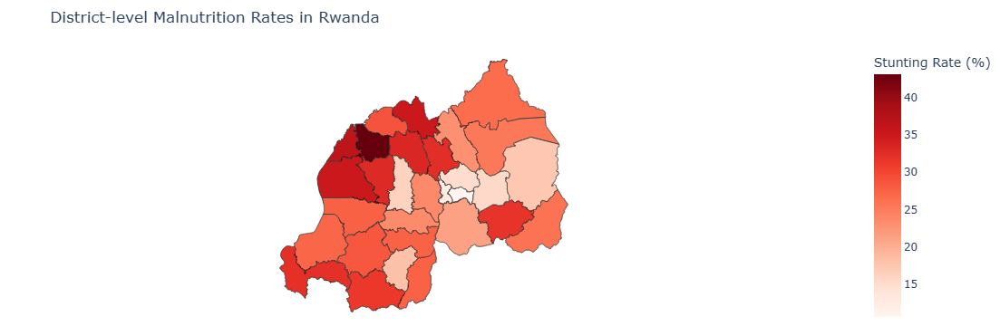

In [27]:
import plotly.express as px
import json

# Load your geojson file
with open("rwanda_districts.geojson") as f:
    rwanda_geojson = json.load(f)

fig = px.choropleth(
    district_geo_summary,
    geojson=rwanda_geojson,
    featureidkey="properties.District",  # Adjust if necessary
    locations="District",
    color="Stunting Rate (%)",
    hover_name="District",
    hover_data={
        "Stunting Rate (%)": True,
        "Wasting Rate (%)": True,
        "Underweight Rate (%)": True,
        #"Household wealth index": True,
        #"Household food security": True,
        #"Minimum Dietary Diversity - Women": True
    },
    color_continuous_scale="Reds",
    title="District-level Malnutrition Rates in Rwanda"
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0})
fig.show()


In [28]:

# OR display a nicely formatted table (for Jupyter/Notebook)
from IPython.display import display
import pandas as pd

display(district_geo_summary)  # ✅ this line was missing a closing parenthesis

# Save district-level geospatial analysis summary to CSV
district_geo_summary.to_csv(r"D:\NISR\RwandaHiddenHungerRwanda\district_geospatial_summary.csv", index=False)


,District,Stunting Rate (%),Wasting Rate (%),Underweight Rate (%),Province,Household_wealth_index_mean,Household_food_security_mean,Min_Dietary_Diversity_Women_mean
0,Bugesera,21.348315,2.808989,8.426966,Eastern,3.505618,3.179775,1.556180
1,Burera,35.151515,6.060606,5.454545,Northern,2.836364,3.042424,1.351515
2,Gakenke,33.333333,0.813008,8.130081,Northern,2.609756,3.268293,1.373984
3,Gasabo,15.075377,1.507538,7.035176,Kigali City,4.286432,3.557789,1.537688
4,Gatsibo,25.388601,1.036269,8.290155,Eastern,2.549223,3.139896,1.310881
5,Gicumbi,23.076923,0.591716,1.183432,Northern,2.763314,3.366864,1.408284
6,Gisagara,27.607362,1.840491,9.815951,Southern,2.552147,2.993865,1.312883
7,Huye,18.120805,3.355705,10.067114,Southern,3.114094,3.046980,1.348993
8,Kamonyi,23.750000,0.625000,6.875000,Southern,3.368750,3.225000,1.637500
9,Karongi,27.710843,3.614458,10.240964,Western,2.632530,2.939759,1.265060


### 📊 Household Access & Infrastructure Summary:-   Validate required columns for analysi
-  � Aggregate key indicators by Province/Distri
-  🧾 Prepare grouped counts for services and basic ne &  🔍 Print samples to verify grouping


In [29]:
# Check for required columns
required_columns = [
    'District', 'Province', 'Household wealth index',
    'Household food security', 'Main Water Source',
    'Toilet Facility', 'Visited by community health worker during last pregnancy?'
]

missing = [col for col in required_columns if col not in final_merged_df.columns]
if missing:
    raise KeyError(f"Missing column(s): {missing}")

# Group and count Household Wealth Index by Province
wealth_counts = (
    final_merged_df
    .groupby(['Province', 'Household wealth index'])
    .size()
    .reset_index(name='Count')
)

# Group and count Household Food Security by District
food_security_counts = (
    final_merged_df
    .groupby(['District', 'Household food security'])
    .size()
    .reset_index(name='Count')
)

# Group and count Water Source by District
water_source_counts = (
    final_merged_df
    .groupby(['District', 'Main Water Source'])
    .size()
    .reset_index(name='Count')
)

# Group and count Access to Sanitation by District
sanitation_counts = (
    final_merged_df
    .groupby(['District', 'Toilet Facility'])
    .size()
    .reset_index(name='Count')
)

# Group and count Access to Health Services by Province
health_access_counts = (
    final_merged_df
    .groupby(['Province', 'Visited by community health worker during last pregnancy?'])
    .size()
    .reset_index(name='Count')
)

# Display example outputs
print("Household Wealth Index counts per province:\n", wealth_counts.head(10))
print("\nHousehold Food Security counts per district:\n", food_security_counts.head(10))
print("\nWater Source counts per district:\n", water_source_counts.head(10))
print("\nSanitation Facility counts per district:\n", sanitation_counts.head(10))
print("\nHealth Worker Visit counts per province:\n", health_access_counts.head(10))


Household Wealth Index counts per province:
       Province Household wealth index  Count
0      Eastern                 Medium    194
1      Eastern                   Poor    262
2      Eastern                Poorest    180
3      Eastern                 Wealth    241
4      Eastern             Wealthiest    276
5  Kigali City                 Medium     31
6  Kigali City                   Poor     37
7  Kigali City                Poorest     14
8  Kigali City                 Wealth    184
9  Kigali City             Wealthiest    378

Household Food Security counts per district:
    District   Household food security  Count
0  Bugesera               Food secure     64
1  Bugesera    Marginally food secure     85
2  Bugesera  Moderately food insecure     26
3  Bugesera    Severely food insecure      3
4    Burera               Food secure     35
5    Burera    Marginally food secure    102
6    Burera  Moderately food insecure     28
7   Gakenke               Food secure     46
8   Gake

## Feature engineering

### 🧪 District Data Consistency Check:
- 🧹 **Standardize district names** across child, woman, and household data by stripping whitespace and converting to lowercase  
- 🔍 **Compare** the three district fields to create a `District_match` flag (True/False)  
- 📊 **Count matches and mismatches**, and display unique inconsistent records for inspection


In [30]:
# Strip whitespace and unify case for district columns
final_merged_df['District_child'] = final_merged_df['District_child'].str.strip().str.lower()
final_merged_df['District_woman'] = final_merged_df['District_woman'].str.strip().str.lower()
final_merged_df['District'] = final_merged_df['District'].str.strip().str.lower()

# Now check match
final_merged_df['District_match'] = (
    (final_merged_df['District_child'] == final_merged_df['District_woman']) &
    (final_merged_df['District_child'] == final_merged_df['District'])
)

print(final_merged_df['District_match'].value_counts())

# If you still get False, see some mismatches
print(final_merged_df.loc[~final_merged_df['District_match'], 
                         ['District_child', 'District_woman', 'District']].drop_duplicates())


District_match
True    5063
Name: count, dtype: int64
Empty DataFrame
Columns: [District_child, District_woman, District]
Index: []


In [31]:

final_merged_df = final_merged_df.drop(
    columns=['Province_child', 'Province_woman', 'District_child', 'District_woman']
)

missing_counts = final_merged_df.isnull().sum()
missing_percent = (missing_counts / len(final_merged_df)) * 100
missing_df = pd.DataFrame({'Missing Count': missing_counts, 'Missing %': missing_percent})
missing_df = missing_df[missing_df['Missing Count'] > 0].sort_values(by='Missing %', ascending=False)

print(missing_df)  # Show top 20 columns with most missing
final_merged_df.drop(columns=['dup'], inplace=True)
final_merged_df = final_merged_df.drop(columns=['household_id'])

print(final_merged_df.shape)


Empty DataFrame
Columns: [Missing Count, Missing %]
Index: []
(5063, 205)


In [32]:
# Step 1: Strip and lowercase column names to catch hidden duplicates
final_merged_df.columns = final_merged_df.columns.str.strip()

# Step 2: Compare the actual contents
urban_1 = final_merged_df['Urban or Rural']
urban_2 = final_merged_df['Urban or rural']

# Check if they are exactly the same
print("Are they identical?", urban_1.equals(urban_2))

# If not, check how many values are different
print("Number of different values:", (urban_1 != urban_2).sum())

# Preview value counts (optional)
print("\nUrban or Rural:")
print(urban_1.value_counts())
print("\nUrban or rural:")
print(urban_2.value_counts())
final_merged_df = final_merged_df.drop(columns=['Urban or rural'])


Are they identical? True
Number of different values: 0

Urban or Rural:
Urban or Rural
Rural    3489
Urban    1574
Name: count, dtype: int64

Urban or rural:
Urban or rural
Rural    3489
Urban    1574
Name: count, dtype: int64


In [33]:
final_merged_df = final_merged_df.drop(columns=['Wasting status', 'Underweight status','Survey Weight',
                                                'Household food security numeric' ,'Interview Date',
                                                'Any Disability in HH','District','Household wealth index numeric',
                                                'Minimum Dietary Diversity - Women numeric'], errors='ignore')


In [34]:
# Select columns with numeric data types
numerical_vars = final_merged_df.select_dtypes(include=[np.number]).columns.tolist()

print(f"Numerical variables found ({len(numerical_vars)}):")
#print(numerical_vars)


Numerical variables found (43):


In [35]:
# numerical_vars is a list of column names
for col in numerical_vars:
    print(f"\n🔹 Column: {col}")
    print(f"Unique values ({final_merged_df[col].nunique()}):")
    print(final_merged_df[col].unique())



🔹 Column: Child index
Unique values (13):
[ 3  4  5  7  6  8  2  9 10 12 13 11 15]

🔹 Column: Age (months)
Unique values (1660):
[36.8  40.34 58.81 ... 19.19 41.03 58.22]

🔹 Column: Birth weight (kg)
Unique values (56):
[ 3.   1.4  3.6  3.7  2.   3.3  3.1  3.5  2.6  9.   2.8  3.8  2.5  3.2
  2.7  4.   3.4  2.2 77.   4.2  1.2  2.9  3.9  4.8  8.9  4.5  9.9  5.1
  4.6  4.4  2.1  2.3  1.7  2.4  4.3  0.9  4.1  1.1  4.7  1.9  5.   1.8
  5.2  1.6  4.9  1.   1.3  1.5  5.5  0.8  5.6  9.4  6.2  6.   5.4  5.8]

🔹 Column: Solid food frequency
Unique values (8):
[2. 0. 3. 1. 7. 4. 5. 6.]

🔹 Column: MUAC child (mm)
Unique values (78):
[149. 150. 160. 170. 156. 161. 141. 159. 155. 128. 140. 131. 133. 151.
 146. 172. 143. 154. 162. 166. 145. 127. 175. 142. 164. 144. 148. 173.
 137. 136. 174. 147. 152. 165. 153. 169. 139. 158. 134. 121. 138. 135.
 184. 130. 129. 171. 157. 168. 179. 163. 177. 122. 167. 176. 186. 124.
 132. 182. 118. 126. 181. 125. 123. 185. 116. 192. 188. 180. 117. 120.
 178. 191. 119.

In [36]:
# Select numerical columns only (int or float)
numerical_df = final_merged_df.select_dtypes(include=['int64', 'int32', 'float64'])
#print(numerical_df.columns.tolist())


In [37]:
# General data exploration
print(final_merged_df.info())
print(final_merged_df.describe())

# Check for missing values
print(final_merged_df.isnull().sum().sum())

# Check unique values for categorical columns
for col in final_merged_df.select_dtypes(include='object').columns:
    print(f"Unique values in {col}: {final_merged_df[col].unique()}")


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5063 entries, 0 to 5062
Columns: 195 entries, Child index to District_match
dtypes: bool(1), category(1), datetime64[ns](1), float64(16), int32(3), int64(24), object(149)
memory usage: 7.4+ MB
None
       Child index                            DOB  Age (months)  \
count  5063.000000                           5063   5063.000000   
mean      4.978076  2021-12-17 03:56:03.934426368     28.869562   
min       2.000000            2019-05-03 00:00:00      0.030000   
25%       3.000000            2020-10-08 00:00:00     14.550000   
50%       5.000000            2022-01-14 00:00:00     27.860000   
75%       6.000000            2023-03-01 00:00:00     43.230000   
max      15.000000            2024-05-25 00:00:00     59.990000   
std       1.898999                            NaN     17.015005   

       Birth weight (kg)  Solid food frequency  MUAC child (mm)  Weight (kg)  \
count        5063.000000           5063.000000      5063.000000  506

In [38]:
# General data exploration
print(numerical_df.info())
print(numerical_df.describe())

# Check for missing values
print(numerical_df.isnull().sum().sum())

# Check unique values for categorical columns
# numerical_vars is a list of column names
for col in numerical_df:
    print(f"\n🔹 Column: {col}")
    print(f"Unique values ({final_merged_df[col].nunique()}):")
    print(final_merged_df[col].unique())



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5063 entries, 0 to 5062
Data columns (total 43 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Child index                        5063 non-null   int64  
 1   Age (months)                       5063 non-null   float64
 2   Birth weight (kg)                  5063 non-null   float64
 3   Solid food frequency               5063 non-null   float64
 4   MUAC child (mm)                    5063 non-null   float64
 5   Weight (kg)                        5063 non-null   float64
 6   Height (cm)                        5063 non-null   float64
 7   Woman's age                        5063 non-null   int64  
 8   Before preparing meals             5063 non-null   int64  
 9   After cleaning child from toilet   5063 non-null   int64  
 10  Before eating                      5063 non-null   int64  
 11  Whenever hands are dirty           5063 non-null   int64

In [39]:
# List of numerical columns (excluding binary/categorical encoded as 0/1 for now)
numerical_cols = [
    'Age (months)', 'Birth weight (kg)', 'Solid food frequency', 'MUAC child (mm)',
    'Weight (kg)', 'Height (cm)', "Woman's age", 'MUAC women in mm',
    'Household Size', 'Active Members', 'Inactive Members', 'Disabled Members',
    'HH Head Age', 'Active, working, and contributing', 'Contribution ratio',
    'Spend on Cereals', 'Spend on Vegetables', 'Spend on Fruits',
    'Spend on Protein (Meat/Fish/Eggs)', 'Spend on Dairy', 'Spend on Fats/Oils',
    'Spend on Sweets', 'Time to Fetch Water (min)', 'Water Usage (liters/day)',
]

df_numeric = final_merged_df[numerical_cols]


### 📊 Summary Statistics & Outlier Detection:
- Generate **descriptive statistics** for all numeric columns with `.describe()`  
- Visualize potential **outliers** using a boxplot for each numeric feature  
- Use `seaborn` and `matplotlib` for clear and informative visualization  


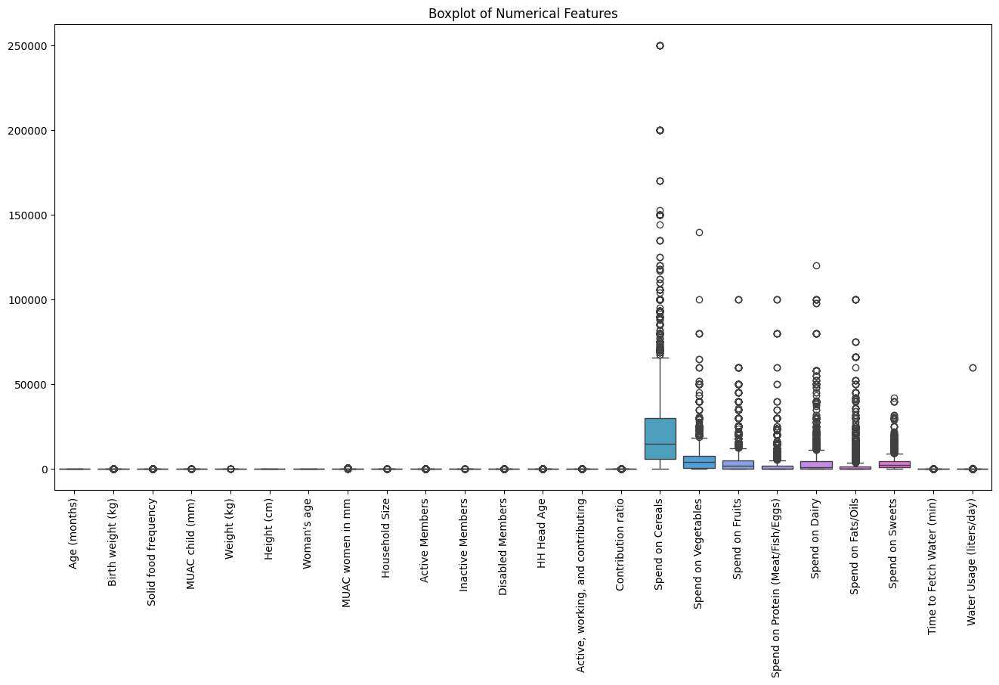

In [40]:
# Summary stats
df_numeric.describe()

# Check for outliers (visual)
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 8))
sns.boxplot(data=df_numeric)
plt.xticks(rotation=90)
plt.title("Boxplot of Numerical Features")
plt.show()


In [41]:
# Check skewness
df_numeric.skew().sort_values(ascending=False)


Water Usage (liters/day)             50.235210
Spend on Protein (Meat/Fish/Eggs)     7.334558
Spend on Fats/Oils                    6.383920
Birth weight (kg)                     5.674181
Spend on Dairy                        5.213861
Spend on Fruits                       4.901651
Disabled Members                      4.856424
Spend on Vegetables                   4.543886
Spend on Sweets                       3.161806
Spend on Cereals                      3.032186
Time to Fetch Water (min)             2.216503
Active Members                        1.666896
HH Head Age                           1.189667
Household Size                        1.092234
Inactive Members                      0.900416
MUAC women in mm                      0.891067
Active, working, and contributing     0.815722
MUAC child (mm)                       0.366743
Weight (kg)                           0.340224
Woman's age                           0.126436
Height (cm)                           0.121171
Age (months) 

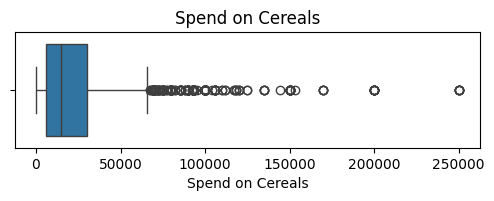

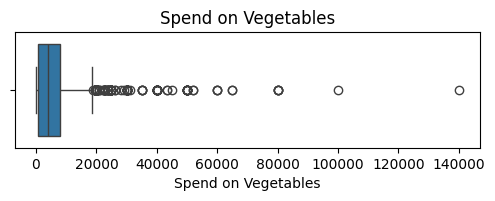

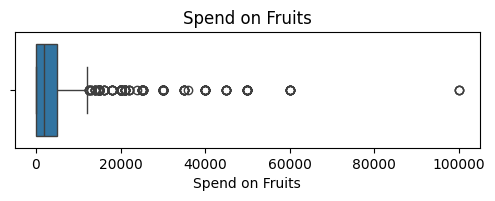

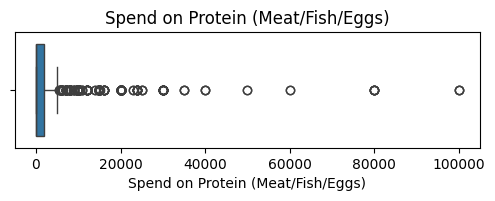

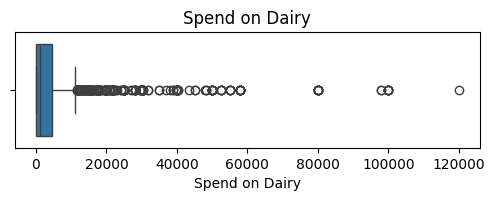

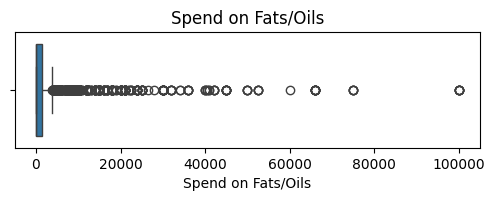

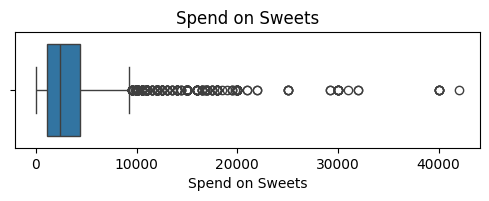

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

spend_columns = [col for col in df_numeric.columns if "Spend on" in col]
for col in spend_columns:
    plt.figure(figsize=(6, 1.5))
    sns.boxplot(x=df_numeric[col])
    plt.title(col)
    plt.show()


### 🔄 Log Transformation for Skewed Features:-
Apply `log1p` to skewed numeric columns to reduce skewness and handle zeros. 
-
Reflect and transform the left-skewed 'Contribution ratio' for normalization.
- 
Use `.copy()` to avoid modifying the original dataset directly.


In [43]:
import numpy as np

# List of skewed features to transform (excluding the ones you chose not to)
to_transform = [
    'Water Usage (liters/day)', 'Spend on Protein (Meat/Fish/Eggs)',
    'Spend on Fats/Oils', 'Spend on Dairy', 'Spend on Fruits',
    'Spend on Vegetables', 'Spend on Sweets', 'Spend on Cereals',
    'Time to Fetch Water (min)',
    'Disabled Members', 'Active Members', 'Inactive Members',
    'HH Head Age', 'Household Size', 'MUAC women in mm',
    'Active, working, and contributing', 'Weight (kg)', 'Height (cm)','Birth weight (kg)'
]

# Apply log1p (log(x + 1)) to handle zeros

df_numeric = df_numeric.copy()
df_numeric[to_transform] = df_numeric[to_transform].apply(np.log1p)


# Reflect and log transform left-skewed contribution ratio
df_numeric.loc[:, 'Contribution ratio'] = df_numeric['Contribution ratio'].max() - df_numeric['Contribution ratio']
df_numeric.loc[:, 'Contribution ratio'] = np.log1p(df_numeric['Contribution ratio'])



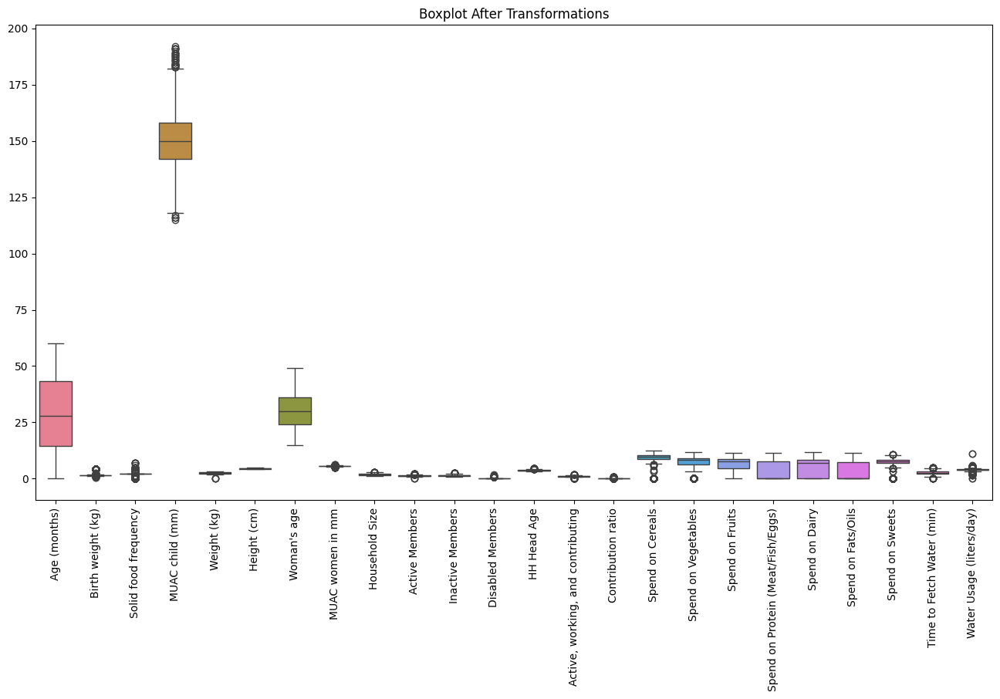

In [44]:
df_numeric.skew().sort_values(ascending=False)

# Boxplot again
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_numeric)
plt.xticks(rotation=90)
plt.title("Boxplot After Transformations")
plt.show()


In [45]:
# Check skewness
df_numeric.skew().sort_values(ascending=False).head()


Birth weight (kg)           4.942676
Disabled Members            3.827222
Contribution ratio          1.655184
Spend on Fats/Oils          0.841722
Water Usage (liters/day)    0.788660
dtype: float64

### 🧪 Variance Threshold Feature Selection:
- Apply a variance threshold to remove low-variance features that provide little information.  
- Select features with variance above the threshold for further analysis.  
- Identify and print features dropped due to low variance.


In [46]:
from sklearn.feature_selection import VarianceThreshold

# Apply variance threshold (tune the threshold as needed)
selector = VarianceThreshold(threshold=0.01)  # Threshold can be 0.01 or even 0.001
df_high_variance = selector.fit_transform(df_numeric)

# Get selected columns (features with variance above threshold)
selected_columns_var = df_numeric.columns[selector.get_support()]

# Get dropped columns (features with variance below threshold)
dropped_columns_var = df_numeric.columns[~selector.get_support()]

print("Selected Features based on Variance Threshold:")
#print(selected_columns_var.tolist())

print("\nDropped Features based on Variance Threshold:")
print(dropped_columns_var.tolist())


Selected Features based on Variance Threshold:

Dropped Features based on Variance Threshold:
[]


### 🔗 Correlation Analysis & Feature Filtering:
- Compute correlation matrix and visualize relationships between numerical features using a heatmap.  
- Identify highly correlated feature pairs with absolute correlation > 0.85.  
- Optionally drop one feature from each highly correlated pair to reduce multicollinearity.


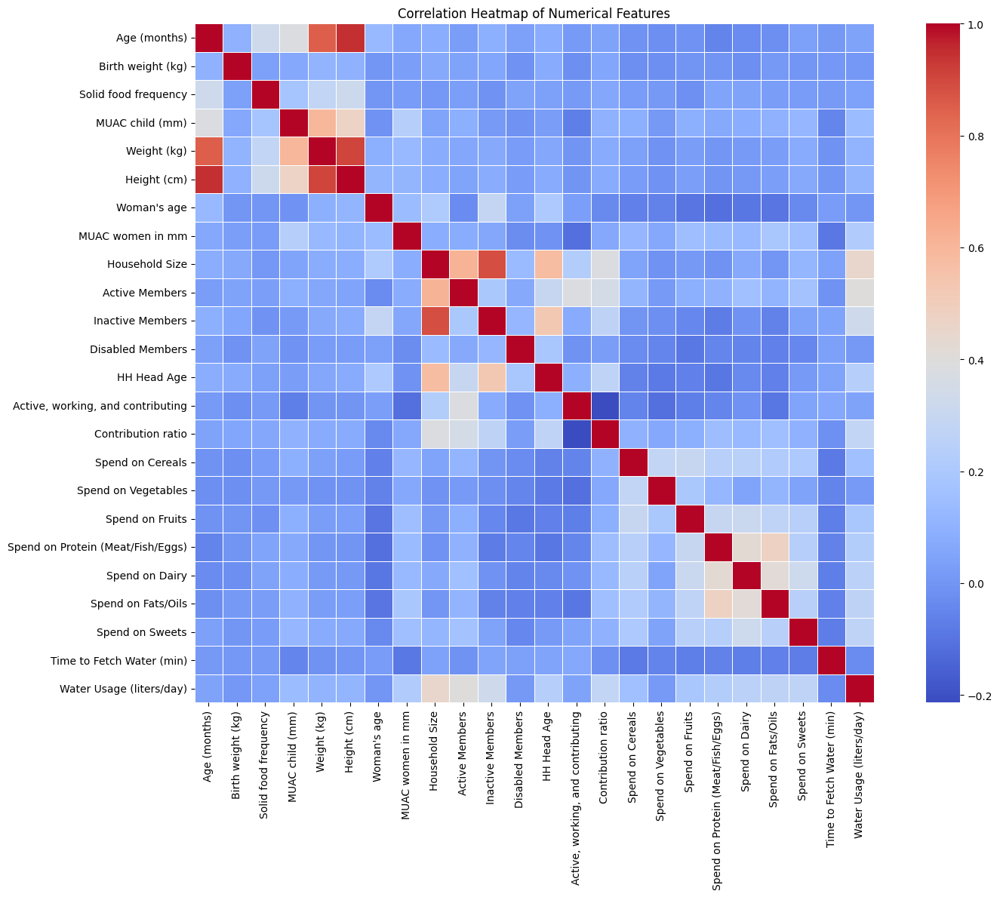

Highly correlated feature pairs (|corr| > 0.85):
Weight (kg) ↔ Age (months) = 0.85
Height (cm) ↔ Age (months) = 0.95
Height (cm) ↔ Weight (kg) = 0.91
Inactive Members ↔ Household Size = 0.89


In [47]:
# Step 1: Correlation matrix
corr_matrix = df_numeric.corr()

# Step 2: Visualize
plt.figure(figsize=(16, 12))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=False, fmt=".2f", square=True, linewidths=0.5)
plt.title("Correlation Heatmap of Numerical Features")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Step 3: Find highly correlated features
corr_abs = corr_matrix.abs()
upper_triangle = corr_abs.where(np.triu(np.ones(corr_abs.shape), k=1).astype(bool))

# Step 4: List highly correlated pairs
high_corr_pairs = [(col, row, corr_abs.loc[row, col]) 
                   for col in upper_triangle.columns 
                   for row in upper_triangle.index 
                   if upper_triangle.loc[row, col] > 0.85]

print("Highly correlated feature pairs (|corr| > 0.85):")
for feature1, feature2, corr_value in high_corr_pairs:
    print(f"{feature1} ↔ {feature2} = {corr_value:.2f}")

# Step 5: Drop one feature from each pair (optional)
to_drop_corr = set()
for col in upper_triangle.columns:
    if any(upper_triangle[col] > 0.85):
        to_drop_corr.add(col)

df_numeric_filtered = df_numeric.drop(columns=to_drop_corr)


### Correlation matrix after drop correlate pairs


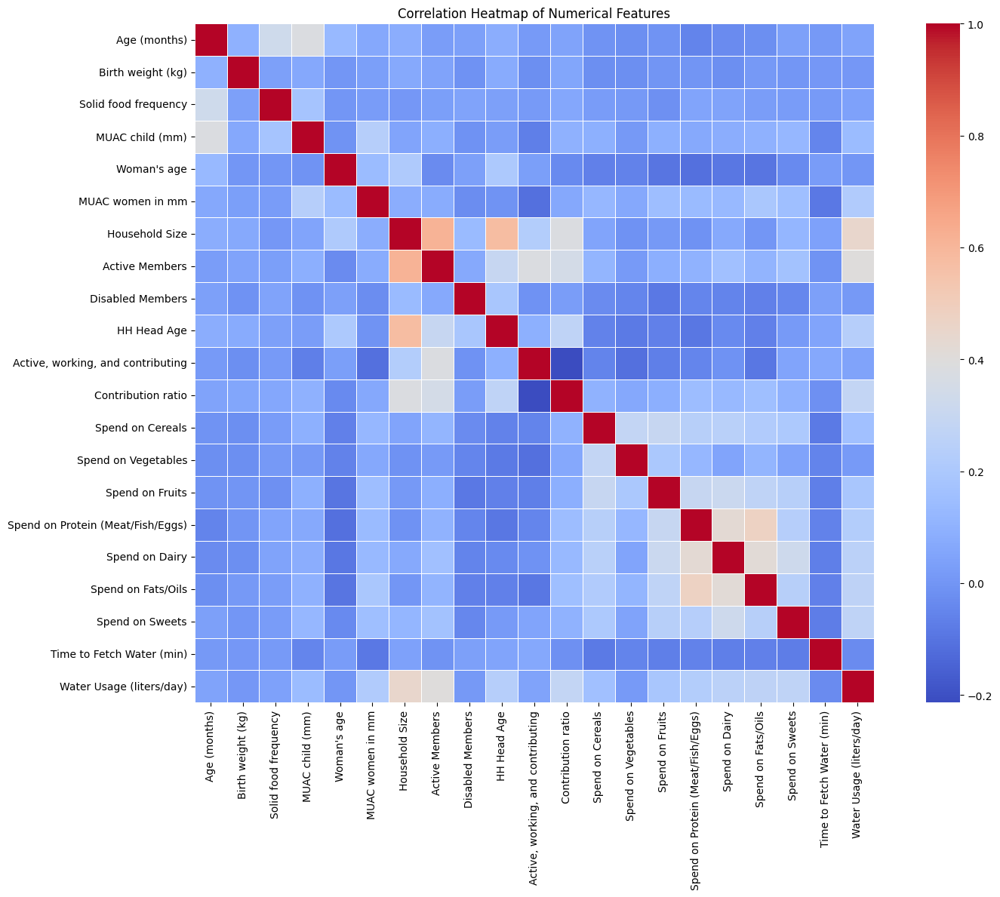

In [48]:
# Step 1: Correlation matrix
corr_matrix = df_numeric_filtered.corr()

# Step 2: Visualize
plt.figure(figsize=(16, 12))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=False, fmt=".2f", square=True, linewidths=0.5)
plt.title("Correlation Heatmap of Numerical Features")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


### 📉 PCA for Dimensionality Reduction:
- Scale numerical features using `StandardScaler & `Fit PCA on scaled data to capture principal components.  
- Plot cumulative explained variance to determine the optimal number of components needed to retain most data variance.


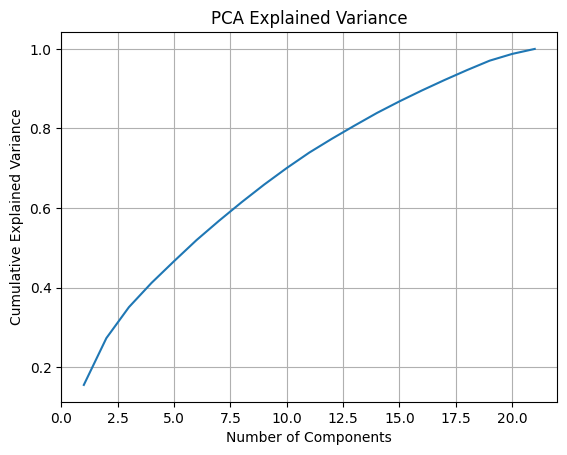

In [49]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_numeric_scaled = scaler.fit_transform(df_numeric_filtered)
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA()
pca.fit(df_numeric_scaled)

plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), 
         pca.explained_variance_ratio_.cumsum())
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.grid(True)
plt.show()


In [50]:
n_components = 10  # Example, pick based on the plot
pca = PCA(n_components=n_components)
df_numeric_pca = pca.fit_transform(df_numeric_scaled)


### 🟢 Binary Feature Processing:
- Identify binary columns (two unique values), split into numeric (0/1) and categorical.  
- Convert numeric binaries to nullable integers and categorical binaries to categories.  
- Create a binary-only DataFrame subset for downstream analysis.


In [51]:
binary_numeric_cols = []
binary_categorical_cols = []

for col in final_merged_df.columns:
    unique_vals = final_merged_df[col].dropna().unique()
    if len(unique_vals) == 2:
        if set(unique_vals) <= {0, 1}:
            binary_numeric_cols.append(col)
        else:
            binary_categorical_cols.append(col)

# Convert binary numeric columns to Int64 (nullable int)
for col in binary_numeric_cols:
    final_merged_df[col] = final_merged_df[col].astype('Int64')

# Convert binary categorical columns to category dtype
for col in binary_categorical_cols:
    final_merged_df[col] = final_merged_df[col].astype('category')

binary_cols = binary_numeric_cols + binary_categorical_cols
binary_df = final_merged_df[binary_cols]

print("✅ Binary-only DataFrame shape:", binary_df.shape)
#print("✅ Binary columns kept:", binary_cols)


✅ Binary-only DataFrame shape: (5063, 46)


### 🗑️ Binary Feature Filtering & Selection:
- Combine binary numeric and categorical columns.  
- Remove highly imbalanced binaries (>98% one value) to avoid low-informative features.  
- Convert categories to numeric codes for variance analysis.  
- Apply variance threshold to exclude near-constant binaries.  


In [52]:
from sklearn.feature_selection import VarianceThreshold

# Step 1: Combine binary numeric and binary categorical columns
all_binary_cols = binary_numeric_cols + binary_categorical_cols

# Step 2: Drop binary columns where one value dominates (>98%)
low_info_binary_cols = [
    col for col in all_binary_cols 
    if final_merged_df[col].value_counts(normalize=True).max() > 0.98
]

print("🗑️ Dropping due to high imbalance:", low_info_binary_cols)

# Step 3: Keep only balanced binary columns
binary_cols_filtered = [col for col in all_binary_cols if col not in low_info_binary_cols]

# Step 4: Create dataframe with only the filtered binary columns
binary_filtered_df = final_merged_df[binary_cols_filtered]

print(f"📐 Shape before variance filter: {binary_filtered_df.shape}")

# Step 5: Convert binary values to numeric (0/1) for variance analysis
binary_filtered_df = binary_filtered_df.apply(lambda x: pd.Series(pd.Categorical(x).codes) if x.dtype.name == 'category' else pd.to_numeric(x, errors='coerce'))

# Step 6: Apply VarianceThreshold to drop near-constant binary features
selector = VarianceThreshold(threshold=0.001)
binary_df_filtered = selector.fit_transform(binary_filtered_df)

# Step 7: Get the list of columns that passed the threshold
selected_binary_cols = binary_filtered_df.columns[selector.get_support()]
#print(f"✅ Binary columns kept after variance threshold: {selected_binary_cols.tolist()}")

# Optional: Show variances of all binary features
variances = binary_filtered_df.var()
print("\n📊 Variances (sorted):")
print(variances.sort_values().head())

# Final confirmation
print("✅ Final binary dataset shape:", binary_df_filtered.shape)


🗑️ Dropping due to high imbalance: ['Never wash hands', 'ANC_place_3', 'Chronic condition?', 'Bilateral pitting edema?', 'Disability that prevents measurement?', 'Ate organ meat', 'Ate fortified blended foods (Nootri mama, etc.)']
📐 Shape before variance filter: (5063, 39)

📊 Variances (sorted):
ANC_place_2                     0.021258
HH Head Disability              0.025958
Other times                     0.036491
Ate meat and poultry            0.043732
Ate Shisha Kibondo / Mubyeyi    0.045165
dtype: Float64
✅ Final binary dataset shape: (5063, 39)


### 🧹 Categorical Data Cleaning & Cardinality Check:
- Remove columns with only one unique value to reduce redundancy.  
- Identify non-binary categorical columns and fill missing values with "Unknown".  
- Detect high-cardinality categorical variables (>20 unique values) for further attention.  


In [53]:
import pandas as pd

# Step 1: Drop columns with only one unique value
target = final_merged_df['Stunting status']
final_merged_df = final_merged_df.loc[:, final_merged_df.nunique() > 1]

# Step 2: Identify non-binary categorical columns (object type)
categorical_cols = final_merged_df.select_dtypes(include=['object']).columns.tolist()

# Step 3: Fill missing values in non-binary categorical columns
final_merged_df[categorical_cols] = final_merged_df[categorical_cols].apply(lambda x: x.fillna('Unknown').astype(str))

# Step 4: Identify high cardinality categorical columns (> 20 unique values)
cat_unique_counts = final_merged_df[categorical_cols].nunique().sort_values(ascending=False)
high_cardinality_cols = cat_unique_counts[cat_unique_counts > 20]

print("📌 Categorical variables with > 20 unique values:")
print(high_cardinality_cols)


📌 Categorical variables with > 20 unique values:
When do you wash hands?                337
Who provided nutrition counselling?     68
Diarrhea treatment                      62
dtype: int64


In [54]:
# Preview common responses
final_merged_df['When do you wash hands?'].value_counts().head()


When do you wash hands?
1 2 3 4 5    598
4            314
3            275
3 4          220
3 5          209
Name: count, dtype: int64

### 🧩 Categorical & Multi-label Encoding:
- Encode target as binary; drop constant and low-variance columns; fill missing categorical values with "Unknown".  
- Expand multi-label columns into binary features; label encode medium-cardinality and one-hot encode low-cardinality categoricals.  
- Combine binary, label-encoded, one-hot, and multi-label features into a unified dataset.  
- Apply ordinal encoding to any remaining categorical columns to finalize encoding for modeling.


In [55]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, OrdinalEncoder
from itertools import chain
import numpy as np

# --- Check target column existence and encode it ---
if 'Stunting status' not in final_merged_df.columns:
    raise KeyError("Target column 'Stunting status' not found!")

target = final_merged_df['Stunting status'].apply(
    lambda x: 1 if x in ['Moderately stunted', 'Severely stunted'] else 0
)
final_merged_df = final_merged_df.drop(columns=['Stunting status'])

# --- Helper functions ---
def multi_label_binary(df, column):
    df[column] = df[column].fillna('').astype(str)
    split_responses = df[column].apply(lambda x: x.strip().split())
    all_codes = sorted(set(chain.from_iterable(split_responses)))
    return pd.DataFrame({
        f'{column}_{code}': split_responses.apply(lambda x: int(code in x))
        for code in all_codes
    }, index=df.index)

def fillna_and_convert(df, cols):
    df[cols] = df[cols].fillna('Unknown').astype(str)
    return df

# --- Drop constant columns ---
final_merged_df = final_merged_df.loc[:, final_merged_df.nunique() > 1]

# Filter out binary columns that were dropped earlier
selected_binary_cols = [col for col in selected_binary_cols if col in final_merged_df.columns]

# --- Retain only selected binary columns and the rest ---
final_merged_df = final_merged_df[selected_binary_cols + [
    col for col in final_merged_df.columns if col not in selected_binary_cols
]]

# --- Identify categorical columns excluding selected binary ---
ategorical_cols = [
    col for col in final_merged_df.select_dtypes(include='object').columns
    if col not in selected_binary_cols
]

# Multi-label columns to process specially
multi_label_cols = [
    'When do you wash hands?',
    'Who provided nutrition counselling?',
    'Diarrhea treatment'
]
multi_label_cols = [col for col in multi_label_cols if col in final_merged_df.columns]

# Fill NA for categorical columns except multi-label
valid_categorical_cols = [col for col in categorical_cols if col not in multi_label_cols]

valid_categorical_cols = [col for col in valid_categorical_cols if col in final_merged_df.columns]
final_merged_df = fillna_and_convert(final_merged_df, valid_categorical_cols)


# --- Label encode medium-cardinality categorical columns ---
label_encode_cols = [
    col for col in valid_categorical_cols
    if 10 < final_merged_df[col].nunique() < 100
]
encoders = {}
for col in label_encode_cols:
    le = LabelEncoder()
    final_merged_df[col] = le.fit_transform(final_merged_df[col])
    encoders[col] = le

# --- Multi-label binary encoding ---
multi_label_dfs = [multi_label_binary(final_merged_df, col) for col in multi_label_cols]
multi_label_df = pd.concat(multi_label_dfs, axis=1) if multi_label_dfs else pd.DataFrame(index=final_merged_df.index)
final_merged_df.drop(columns=multi_label_cols, inplace=True)

# --- One-hot encode remaining low-cardinality categorical columns ---
manageable_cat_cols = [
    col for col in final_merged_df.select_dtypes(include='object').columns
    if col not in label_encode_cols
]
final_merged_df = fillna_and_convert(final_merged_df, manageable_cat_cols)

if manageable_cat_cols:
    ohe = OneHotEncoder(drop='first', sparse_output=False)
    df_ohe = pd.DataFrame(
        ohe.fit_transform(final_merged_df[manageable_cat_cols]),
        columns=ohe.get_feature_names_out(manageable_cat_cols),
        index=final_merged_df.index
    )
    final_merged_df.drop(columns=manageable_cat_cols, inplace=True)
else:
    df_ohe = pd.DataFrame(index=final_merged_df.index)

# --- Final concatenation of all binary, label-encoded, one-hot and multi-label ---
selected_binary_cols = [col for col in selected_binary_cols if col in final_merged_df.columns]
X_cat_label_encoded = final_merged_df[label_encode_cols] if label_encode_cols else pd.DataFrame(index=final_merged_df.index)
X_selected_binary = final_merged_df[selected_binary_cols]  # safe subset

X_cat_selected = pd.concat([X_selected_binary, X_cat_label_encoded, df_ohe, multi_label_df], axis=1)

# --- Apply OrdinalEncoder on any remaining categorical/object columns ---
from sklearn.preprocessing import OrdinalEncoder

ordinal_encoder = OrdinalEncoder()

# Find remaining object or category dtype columns in X_cat_selected
cat_for_ordinal = X_cat_selected.select_dtypes(include=['object', 'category']).columns.tolist()

if cat_for_ordinal:
    for col in cat_for_ordinal:
        if isinstance(X_cat_selected[col].dtype, pd.CategoricalDtype):
            X_cat_selected[col] = X_cat_selected[col].cat.add_categories(['Unknown'])
            X_cat_selected[col] = X_cat_selected[col].fillna('Unknown').astype(str)

    X_cat_selected[cat_for_ordinal] = ordinal_encoder.fit_transform(X_cat_selected[cat_for_ordinal])


if cat_for_ordinal:
    # Fill NA and convert to string to avoid errors
    X_cat_selected[cat_for_ordinal] = X_cat_selected[cat_for_ordinal].fillna('Unknown').astype(str)
    X_cat_selected[cat_for_ordinal] = ordinal_encoder.fit_transform(X_cat_selected[cat_for_ordinal])

# Final confirmation
print("✅ Final encoded dataset shape:", X_cat_selected.shape)


✅ Final encoded dataset shape: (5063, 332)


### 🔍 Feature Selection Using Mutual Information:
- Compute mutual information (MI) between categorical features and the target.  
- Rank and filter features by MI score, keeping only those above a threshold (e.g., 0.01).  
- Retain the selected high-information features for further modeling.


In [56]:
from sklearn.feature_selection import mutual_info_classif

# Calculate MI scores for each categorical feature in X_cat_selected
mi_scores = mutual_info_classif(X_cat_selected, target, discrete_features=True)

# Create a Series for easy sorting and filtering
mi_series = pd.Series(mi_scores, index=X_cat_selected.columns)

# Example: Keep features with MI above a threshold (e.g., 0.01)
selected_cat_features = mi_series[mi_series > 0.01].index.tolist()

# Filter X_cat_selected with the selected features only
X_cat_selected_filtered = X_cat_selected[selected_cat_features]


### 🛠️ Final Modeling Dataset Preparation:
- Combine filtered binary, numeric, and categorical features into a single DataFrame.  
- Append the binary target variable for modeling purposes.  
- Confirm dataset shape to ensure correctness before analysis.


In [57]:


# --- Final modeling dataframe ---
binary_selected_df = binary_filtered_df[selected_binary_cols]

# Now you can concatenate
df_model = pd.concat([
    binary_selected_df.reset_index(drop=True),
    df_numeric_filtered.reset_index(drop=True),
    X_cat_selected_filtered.reset_index(drop=True)
], axis=1)


# Attach binary target
df_model['stunting_binary'] = target

print("✅ Final df_model shape:", df_model.shape)
#print(df_model.columns.tolist())

✅ Final df_model shape: (5063, 69)


In [58]:
# Check for duplicate column names
dupe_cols = df_model.columns[df_model.columns.duplicated()].tolist()
print("Duplicate column names:", dupe_cols)
# Keep last occurrence of duplicate columns
df_model = df_model.loc[:, ~df_model.columns.duplicated(keep='last')]

# Verify duplicates are removed
print("Duplicate columns after dropping (keep first):", df_model.columns[df_model.columns.duplicated()].tolist())


Duplicate column names: ['Urban or Rural']
Duplicate columns after dropping (keep first): []


In [59]:
print(mi_series.head(10))


Before preparing meals              2.657724e-04
After cleaning child from toilet    1.736490e-03
Before eating                       3.305376e-04
Whenever hands are dirty            1.067747e-03
After visiting toilet               4.136543e-03
Other times                         4.407862e-07
ANC_place_1                         1.468741e-03
ANC_place_2                         1.332973e-03
Sex                                 3.015668e-03
What used to wash hands?            1.506627e-03
dtype: float64


## XGBoost Model

📊 Class distribution in training data: Counter({0: 3004, 1: 1046})
⚖️ scale_pos_weight: 3.87


C:\Users\CTRL-SHIFT LTD\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\xgboost\training.py:183: UserWarning:

[14:32:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.





✅ Accuracy: 0.7285291214215203
🎯 F1 Score: 0.5749613601236476
🔥 AUC Score: 0.8031987883839359

📄 Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.74      0.80       751
           1       0.48      0.71      0.57       262

    accuracy                           0.73      1013
   macro avg       0.68      0.72      0.69      1013
weighted avg       0.78      0.73      0.74      1013



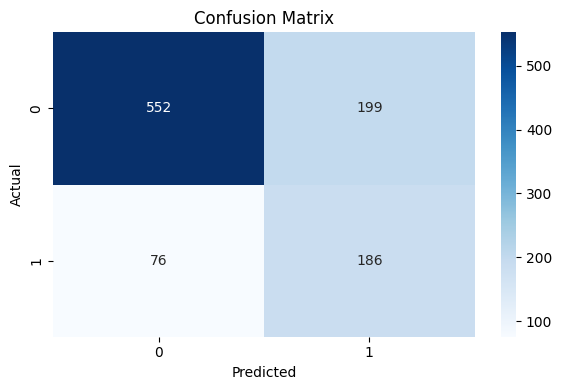

In [60]:
# -------------------------------
# 📦 Imports
# -------------------------------
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import os
from collections import Counter

from xgboost import XGBClassifier
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    roc_auc_score, f1_score, roc_curve, auc
)
from sklearn.model_selection import train_test_split

# -------------------------------
# 1. ✅ Prepare X and y
# -------------------------------
X = df_model.drop(columns=['stunting_binary'])
y = df_model['stunting_binary']

# One-hot encode categorical variables
X = pd.get_dummies(X, drop_first=True)

# Clean column names
X.columns = X.columns.str.replace(r"[\[\]<>\(\)]", "", regex=True)

# -------------------------------
# 2. ✅ Train-test split
# -------------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, test_size=0.2, random_state=42
)

# -------------------------------
# 3. ✅ Convert to float32 for XGBoost
# -------------------------------
X_train = X_train.astype(np.float32)
X_test = X_test.astype(np.float32)

# -------------------------------
# 4. ⚖️ Handle class imbalance
# -------------------------------
class_counts = Counter(y_train)
print("📊 Class distribution in training data:", class_counts)

neg, pos = class_counts[0], class_counts[1]
scale_pos_weight = 3.87 # manually set based on your data
print(f"⚖️ scale_pos_weight: {scale_pos_weight:.2f}")

# -------------------------------
# 5. 🚀 Train XGBoost
# -------------------------------
xgb_model = XGBClassifier(
    use_label_encoder=False,
    eval_metric='logloss',
    scale_pos_weight=scale_pos_weight,
    learning_rate=0.05,
    max_depth=6,
    n_estimators=300,
    random_state=42,
    n_jobs=-1
)

xgb_model.fit(
    X_train.values,
    y_train.values,
    eval_set=[(X_test.values, y_test.values)],
    verbose=False
)

# -------------------------------
# 6. 💾 Save model
# -------------------------------
model_dir = r"D:\NISR\RwandaHiddenHungerRwanda\Models"
os.makedirs(model_dir, exist_ok=True)

joblib.dump(xgb_model, os.path.join(model_dir, 'xgb_model.pkl'))

# -------------------------------
# 7. 📈 Evaluation
# -------------------------------
y_pred = xgb_model.predict(X_test.values)
y_pred_prob = xgb_model.predict_proba(X_test.values)[:, 1]

print("\n✅ Accuracy:", accuracy_score(y_test, y_pred))
print("🎯 F1 Score:", f1_score(y_test, y_pred))
print("🔥 AUC Score:", roc_auc_score(y_test, y_pred_prob))
print("\n📄 Classification Report:\n", classification_report(y_test, y_pred))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

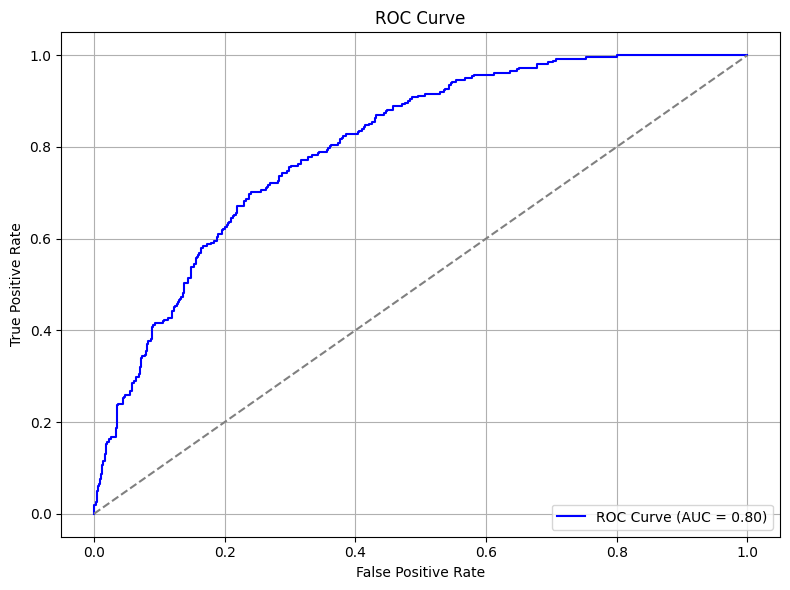

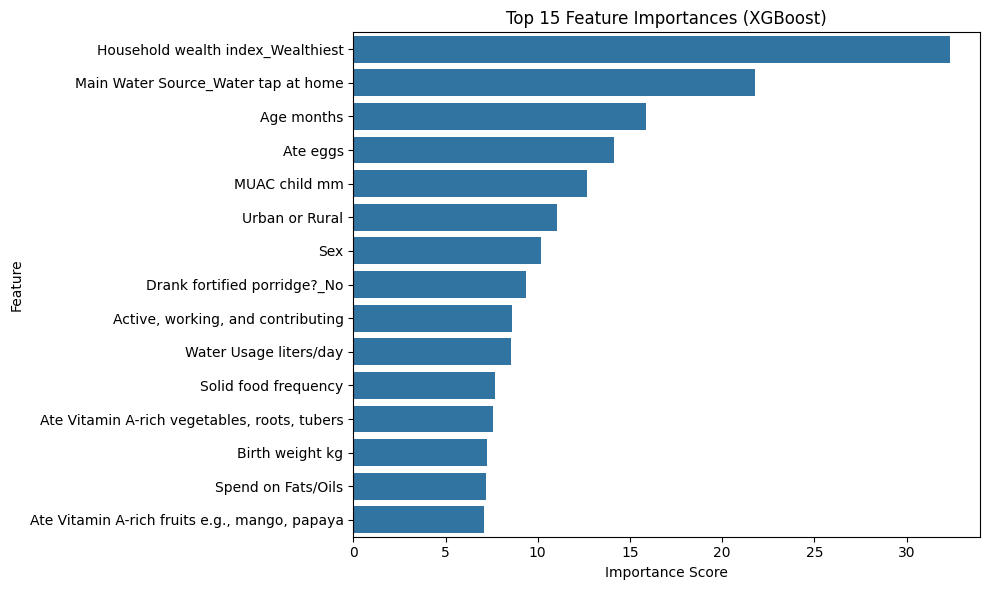


🔝 Top 15 Features by Gain:
                                           Feature  Importance  Abs_Importance
66              Household wealth index_Wealthiest   32.356239       32.356239
65            Main Water Source_Water tap at home   21.762018       21.762018
38                                     Age months   15.863417       15.863417
20                                       Ate eggs   14.157286       14.157286
41                                  MUAC child mm   12.695341       12.695341
59                                 Urban or Rural   11.019593       11.019593
8                                             Sex   10.167954       10.167954
64                   Drank fortified porridge?_No    9.364157        9.364157
48              Active, working, and contributing    8.604121        8.604121
58                         Water Usage liters/day    8.549757        8.549757
40                           Solid food frequency    7.697846        7.697846
22   Ate Vitamin A-rich vegetables,

In [61]:
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})', color='blue')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

# -------------------------------
# 8. 📊 Feature Importances
# -------------------------------
# Get feature importances by gain
importance_dict = xgb_model.get_booster().get_score(importance_type='gain')

# Map raw feature names to original column names
feature_map = {f'f{idx}': col for idx, col in enumerate(X_train.columns)}
importance_df = pd.DataFrame({
    'Feature': [feature_map.get(k, k) for k in importance_dict.keys()],
    'Importance': list(importance_dict.values())
})

# Add absolute importance
importance_df['Abs_Importance'] = np.abs(importance_df['Importance'])

# Sort by importance
importance_df = importance_df.sort_values(by='Abs_Importance', ascending=False)

# Plot Top N
top_n = 15
plt.figure(figsize=(10, 6))
sns.barplot(x=importance_df.head(top_n)['Importance'], y=importance_df.head(top_n)['Feature'])
plt.title(f"Top {top_n} Feature Importances (XGBoost)")
plt.xlabel("Importance Score")
plt.tight_layout()
plt.show()

# Save to CSV
importance_df.head(20).to_csv(
    r'D:\NISR\RwandaHiddenHungerRwanda\Data\xgb_feature_importances.csv',
    index=False
)

# Print top 15
print("\n🔝 Top 15 Features by Gain:\n", importance_df.head(15))

## lightgbm Model

Training features datatypes:
 float64    67
Name: count, dtype: int64
Class weights: {0: 0.6741011984021305, 1: 1.935946462715105}
After SMOTE, class distribution: Counter({0: 3004, 1: 3004})
[LightGBM] [Info] Number of positive: 3004, number of negative: 3004
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14987
[LightGBM] [Info] Number of data points in the train set: 6008, number of used features: 67
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.741728 -> initscore=1.054971
[LightGBM] [Info] Start training from score 1.054971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

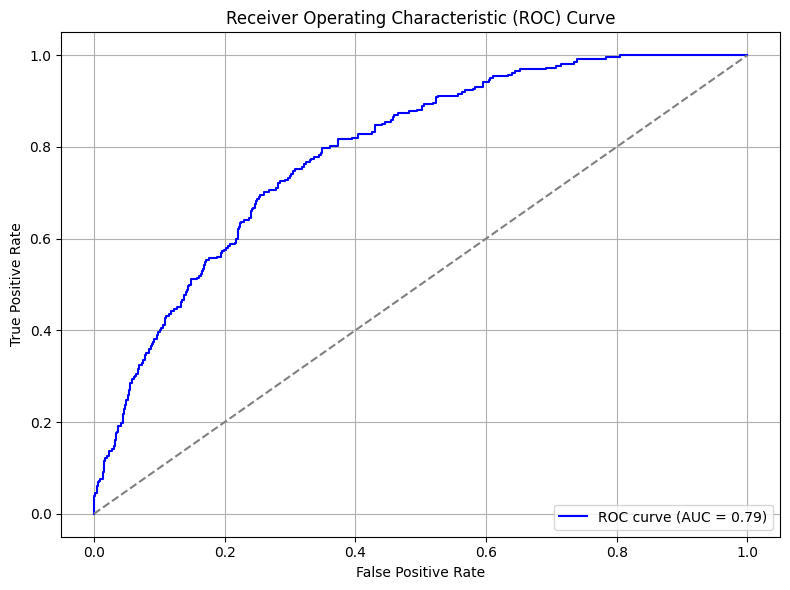

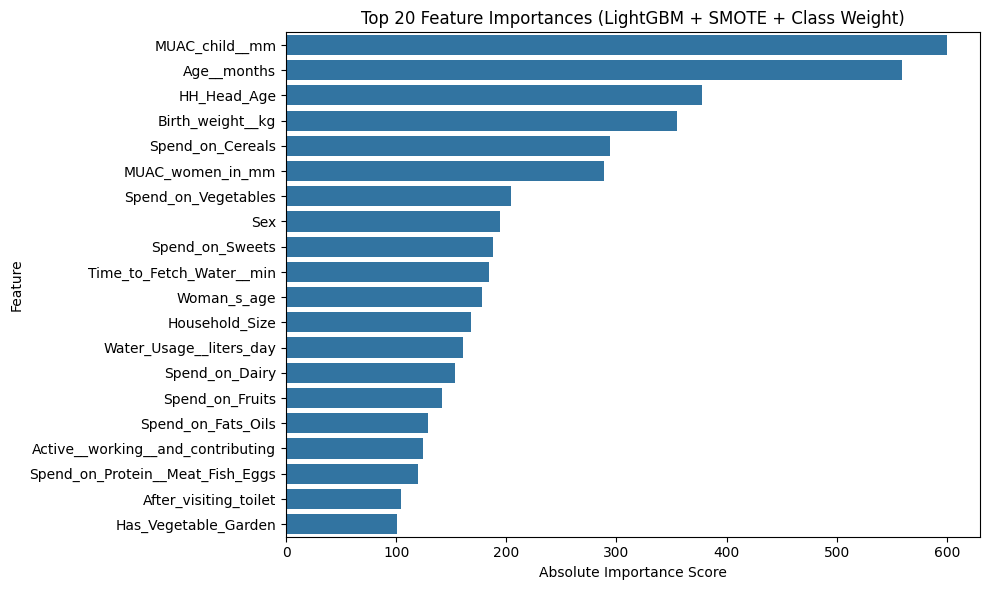


📁 Feature importances saved to: D:\NISR\RwandaHiddenHungerRwanda\Data\lgbm_smote_classweight_feature_importance.csv

✅ Top 10 Important Features:
                     Feature  Importance  Abs_Importance
41            MUAC_child__mm         600             600
38               Age__months         559             559
47               HH_Head_Age         378             378
39          Birth_weight__kg         355             355
50          Spend_on_Cereals         294             294
43          MUAC_women_in_mm         289             289
51       Spend_on_Vegetables         204             204
8                        Sex         194             194
56           Spend_on_Sweets         188             188
57  Time_to_Fetch_Water__min         184             184


In [62]:
# --- 0. Imports ---
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os

from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    f1_score, roc_curve, auc, roc_auc_score
)
from imblearn.over_sampling import SMOTE
from sklearn.utils.class_weight import compute_class_weight
import lightgbm as lgb

# For reproducibility
np.random.seed(42)

# --- 1. Load your data ---
# df_model = pd.read_csv('your_data.csv')  # Replace with your actual path

# --- 2. Clean and deduplicate column names ---
def clean_and_make_unique_columns(columns):
    cleaned = [re.sub(r'[^0-9a-zA-Z_]', '_', col).strip('_') for col in columns]
    seen = {}
    unique = []
    for col in cleaned:
        if col not in seen:
            seen[col] = 1
            unique.append(col)
        else:
            seen[col] += 1
            unique.append(f"{col}_{seen[col]}")
    return unique

df_model.columns = clean_and_make_unique_columns(df_model.columns)

# --- 3. Prepare features and target ---
X = df_model.drop(columns='stunting_binary')
y = df_model['stunting_binary']

# --- 4. Train-test split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# --- 5. Ensure numeric types and handle missing values ---
X_train = X_train.apply(pd.to_numeric, errors='coerce').fillna(0).astype(float)
X_test = X_test.apply(pd.to_numeric, errors='coerce').fillna(0).astype(float)

print("Training features datatypes:\n", X_train.dtypes.value_counts())

# --- 6. Calculate class weights ---
classes = np.unique(y_train)
class_weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weight_dict = dict(zip(classes, class_weights))
print(f"Class weights: {class_weight_dict}")

# --- 7. Apply SMOTE to balance classes ---
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)
print(f"After SMOTE, class distribution: {Counter(y_train_res)}")

# --- 8. Train LightGBM with class weights ---
lgbm = lgb.LGBMClassifier(
    random_state=42,
    class_weight=class_weight_dict,
    n_estimators=300,
    learning_rate=0.05,
    max_depth=5
)
lgbm.fit(X_train_res, y_train_res)

# Save expected feature list


model_dir = r"D:\NISR\RwandaHiddenHungerRwanda\Models"
os.makedirs(model_dir, exist_ok=True)

# Save the trained model (lgbm) and expected features after training
joblib.dump(lgbm, os.path.join(model_dir, 'lgbm_model.pkl'))
joblib.dump(list(X_train.columns), os.path.join(model_dir, 'expected_features.pkl'))


# --- Predict on test data ---
y_pred = lgbm.predict(X_test)
y_pred_prob = lgbm.predict_proba(X_test)[:, 1]

# --- Evaluation Metrics ---
acc = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc_score = roc_auc_score(y_test, y_pred_prob)

print(f"\n🔍 Accuracy: {acc:.4f}")
print(f"🔢 F1 Score: {f1:.4f}")
print(f"📈 AUC: {auc_score:.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred))

# --- ROC Curve ---
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})', color='blue')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Feature Importances ---
importances = lgbm.feature_importances_
feature_names = X_train.columns

feat_imp_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances,
    'Abs_Importance': np.abs(importances)  # Usually redundant for LGBM, but added for clarity
}).sort_values(by='Abs_Importance', ascending=False)

# --- Top 20 Plot ---
plt.figure(figsize=(10, 6))
sns.barplot(x=feat_imp_df.head(20)['Abs_Importance'], y=feat_imp_df.head(20)['Feature'])
plt.title("Top 20 Feature Importances (LightGBM + SMOTE + Class Weight)")
plt.xlabel("Absolute Importance Score")
plt.tight_layout()
plt.savefig("lgbm_smote_classweight_top_features.png")
plt.show()

# --- Save feature importances to CSV ---
feature_csv_path = r"D:\NISR\RwandaHiddenHungerRwanda\Data\lgbm_smote_classweight_feature_importance.csv"
feat_imp_df.to_csv(feature_csv_path, index=False)
print(f"\n📁 Feature importances saved to: {feature_csv_path}")

# --- Display top 10 features ---
print("\n✅ Top 10 Important Features:")
print(feat_imp_df.head(10))


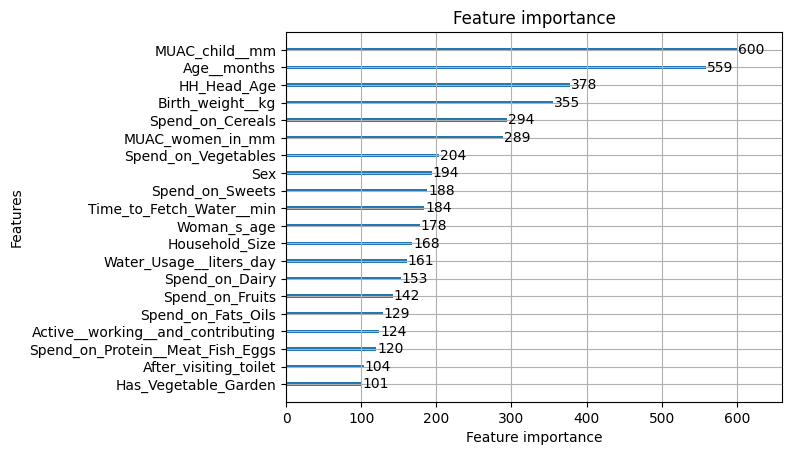

In [63]:
import matplotlib.pyplot as plt

lgb.plot_importance(lgbm, max_num_features=20)
plt.show()


## Catboost Model

Training features datatypes after conversion:
 float64    67
Name: count, dtype: int64
Class weights on original data: [0.6741011984021305, 1.935946462715105]
0:	total: 143ms	remaining: 28.4s
100:	total: 540ms	remaining: 529ms
199:	total: 913ms	remaining: 0us

📊 CatBoost Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.71      0.78       751
           1       0.46      0.72      0.56       262

    accuracy                           0.71      1013
   macro avg       0.67      0.71      0.67      1013
weighted avg       0.77      0.71      0.73      1013

AUC Score: 0.7952
F1 Score: 0.5620


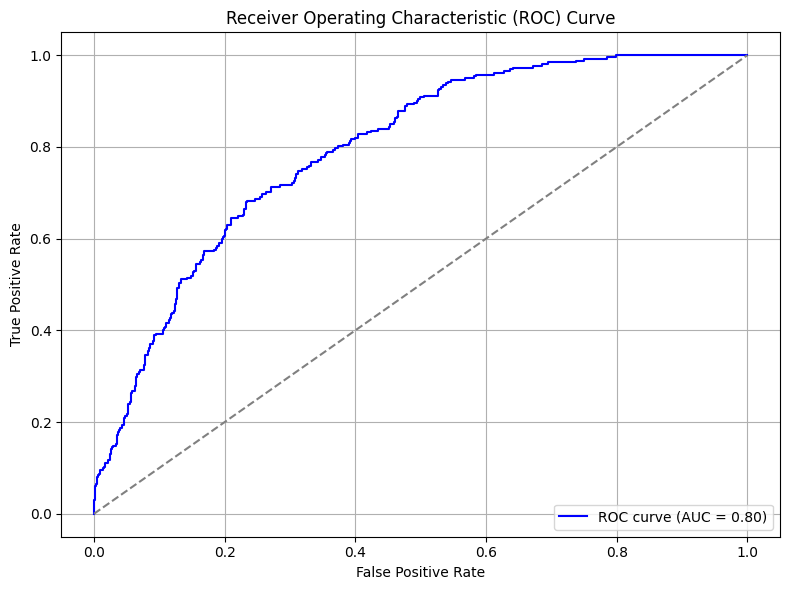

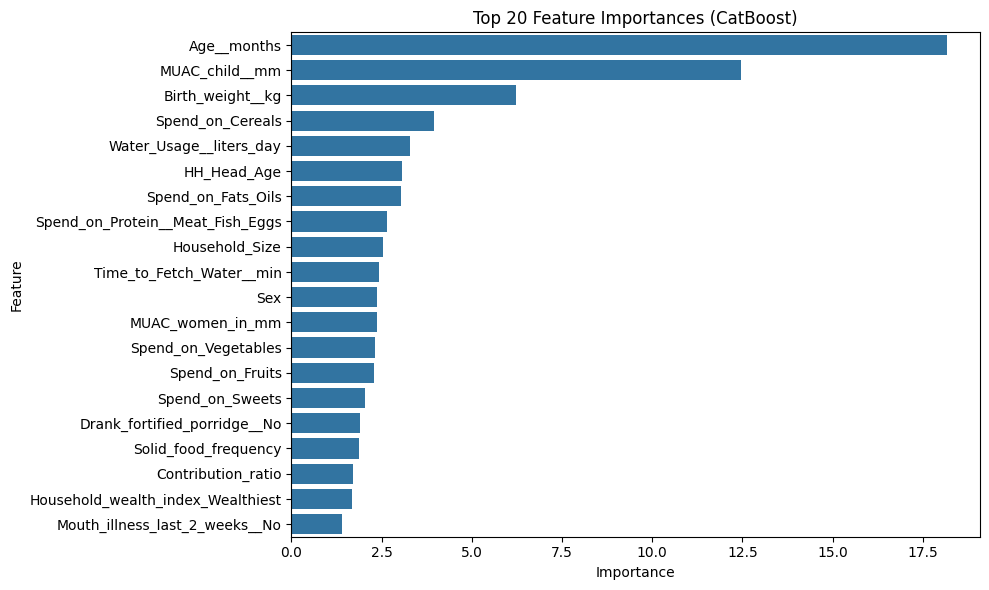

Feature importances saved to: D:\NISR\RwandaHiddenHungerRwanda\Data\cat_feature_importances.csv
Model and feature list saved successfully.


In [64]:
# --- 0. Imports ---
import pandas as pd
import numpy as np
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score, f1_score, roc_curve, auc
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import os

# Optional: Set random seed for reproducibility
np.random.seed(42)

# --- 1. Load your data ---
# Replace this with your actual data loading
# df_model = pd.read_csv('your_dataset.csv')

# --- 2. Prepare features and target ---
X = df_model.drop(columns='stunting_binary')
y = df_model['stunting_binary']

# --- 3. Train-test split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# --- 4. Data cleaning and type conversion ---
X_train = X_train.apply(pd.to_numeric, errors='coerce').fillna(0).astype(float)
X_test = X_test.apply(pd.to_numeric, errors='coerce').fillna(0).astype(float)

print("Training features datatypes after conversion:\n", X_train.dtypes.value_counts())

# --- 5. Calculate class weights on original training data ---
classes = np.unique(y_train)
class_weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weights_list = class_weights.tolist()
print(f"Class weights on original data: {class_weights_list}")

# --- 6. Train CatBoost model without SMOTE ---
cat_model = CatBoostClassifier(
    iterations=200,
    learning_rate=0.05,
    depth=6,
    eval_metric='AUC',
    verbose=100,
    random_seed=42,
    class_weights=class_weights_list  # Use class weights here
)

cat_model.fit(X_train, y_train)


# --- 7. Predict on test data ---
y_pred_cat = cat_model.predict(X_test)
y_pred_prob_cat = cat_model.predict_proba(X_test)[:, 1]

# --- 8. Evaluate the model ---
print("\n📊 CatBoost Classification Report:")
print(classification_report(y_test, y_pred_cat))
print(f"AUC Score: {roc_auc_score(y_test, y_pred_prob_cat):.4f}")
print(f"F1 Score: {f1_score(y_test, y_pred_cat):.4f}")

# --- 9. Plot ROC curve ---
fpr, tpr, _ = roc_curve(y_test, y_pred_prob_cat)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})', color='blue')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

importances = cat_model.get_feature_importance()
feature_names = X_train.columns

# Create DataFrame of feature importances
feat_imp_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot top 20 feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feat_imp_df.head(20))
plt.title("Top 20 Feature Importances (CatBoost)")
plt.tight_layout()
plt.show()

# Save feature importances to CSV
data_dir = r"D:\NISR\RwandaHiddenHungerRwanda\Data"
os.makedirs(data_dir, exist_ok=True)

feat_imp_file = os.path.join(data_dir, "cat_feature_importances.csv")
feat_imp_df.to_csv(feat_imp_file, index=False)
print(f"Feature importances saved to: {feat_imp_file}")

# --- 11. Save Model and Expected Features ---

model_dir = r"D:\NISR\RwandaHiddenHungerRwanda\Models"
os.makedirs(model_dir, exist_ok=True)

# Save CatBoost model in native format
cat_model.save_model(os.path.join(model_dir, 'catboost_model.cbm'))

# Save model using joblib (for Python reloading)
joblib.dump(cat_model, os.path.join(model_dir, 'catboost_model.pkl'))

# Save list of expected features
joblib.dump(list(X_train.columns), os.path.join(model_dir, 'expected_features_cat.pkl'))

print("Model and feature list saved successfully.")


#!python -m pip install --upgrade pip

## Logistic Regression Model


🔍 Accuracy: 0.6811

📊 Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.65      0.74       721
           1       0.47      0.75      0.58       292

    accuracy                           0.68      1013
   macro avg       0.67      0.70      0.66      1013
weighted avg       0.75      0.68      0.70      1013


🔢 F1 Score: 0.5756

📈 AUC (Area Under Curve): 0.7649

✅ Feature importances saved to: D:\NISR\RwandaHiddenHungerRwanda\Data\logreg_feature_importance.csv

✅ Top 10 Important Features:
                                                             Feature  \
MUAC_child__mm                                        MUAC_child__mm   
Drank_fortified_porridge__No            Drank_fortified_porridge__No   
Mouth_illness_last_2_weeks__No        Mouth_illness_last_2_weeks__No   
Solid_food_frequency                            Solid_food_frequency   
Household_Size                                        Household_Size   
Water_Usag

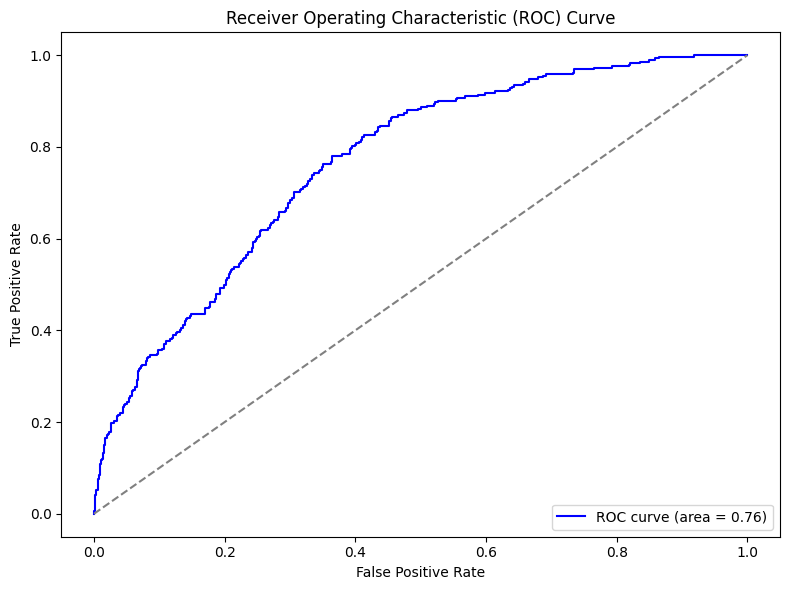

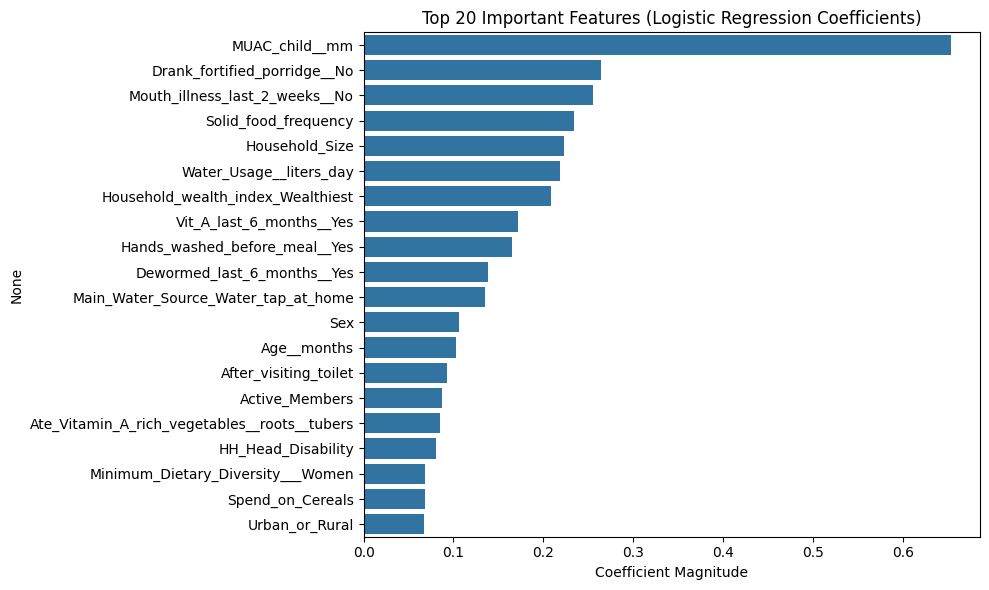

In [65]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    classification_report, accuracy_score, roc_auc_score,
    f1_score, roc_curve, auc
)

# 2. Define features and target
X = df_model.drop(columns='stunting_binary')
y = df_model['stunting_binary']

# 3. One-hot encode categorical variables
X_encoded = pd.get_dummies(X, drop_first=True)

# 4. Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_encoded, y, test_size=0.2, random_state=42
)

# 5. Feature scaling (standardization)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ------------------------------
# 6. Train Logistic Regression
# ------------------------------
log_reg = LogisticRegression(
    max_iter=1000,
    solver='lbfgs',
    class_weight='balanced',
    random_state=42,
)

log_reg.fit(X_train_scaled, y_train)

# Optional: save model & scaler
import os
model_dir = r"D:\NISR\RwandaHiddenHungerRwanda\Models"
os.makedirs(model_dir, exist_ok=True)
joblib.dump(log_reg, os.path.join(model_dir, 'log_reg_model.pkl'))
joblib.dump(scaler, os.path.join(model_dir, 'log_reg_scaler.pkl'))

# ------------------------------
# 7. Predict & Evaluate
# ------------------------------
y_pred = log_reg.predict(X_test_scaled)
y_pred_prob = log_reg.predict_proba(X_test_scaled)[:, 1]

# Accuracy
acc = accuracy_score(y_test, y_pred)
print(f"\n🔍 Accuracy: {acc:.4f}")

# Classification Report
print("\n📊 Classification Report:")
print(classification_report(y_test, y_pred))

# F1 Score
f1 = f1_score(y_test, y_pred)
print(f"\n🔢 F1 Score: {f1:.4f}")

# AUC Score
auc_score = roc_auc_score(y_test, y_pred_prob)
print(f"\n📈 AUC (Area Under Curve): {auc_score:.4f}")

# ------------------------------
# 8. Feature Importances
# ------------------------------
coefs = pd.Series(log_reg.coef_[0], index=X_train.columns)
coefs_sorted = coefs.abs().sort_values(ascending=False)
top_features = coefs_sorted.head(20)

# Save feature importances
feature_importance_df = pd.DataFrame({
    'Feature': coefs_sorted.index,
    'Coefficient': coefs[coefs_sorted.index],
    'Abs_Coefficient': coefs_sorted.values
})
feature_csv_path = r'D:\NISR\RwandaHiddenHungerRwanda\Data\logreg_feature_importance.csv'
feature_importance_df.to_csv(feature_csv_path, index=False)
print(f"\n✅ Feature importances saved to: {feature_csv_path}")

print("\n✅ Top 10 Important Features:")
print(feature_importance_df.head(10))

# ------------------------------
# 9. ROC Curve Plot
# ------------------------------
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()

# ------------------------------
# 10. Plot top features
# ------------------------------
plt.figure(figsize=(10, 6))
sns.barplot(x=top_features.values, y=top_features.index)
plt.title('Top 20 Important Features (Logistic Regression Coefficients)')
plt.xlabel('Coefficient Magnitude')
plt.tight_layout()
plt.show()


### Model Evaluation & Comparison Workflow

- **Load pre-trained models and preprocessing tools**  Ensures consistent use of saved models and feature processing pipelines

- **Align and preprocess test data** to Aligns test features with expected model inputs and scales data as needed
- **Predict and evaluate across multiple models**  to assess performance.

- **Summarize and save results**  Collects evaluation metrics into a DataFrame and exports to CSV for easy review and reporting.


In [68]:
import os
import joblib
import pandas as pd
from sklearn.metrics import classification_report, roc_auc_score

# -------------------------------
# Define paths
# -------------------------------
model_dir = r"D:\NISR\RwandaHiddenHungerRwanda\Models"

# -------------------------------
# Load models and preprocessor
# -------------------------------
xgb_model = joblib.load(os.path.join(model_dir, 'xgb_model.pkl'))
lgbm = joblib.load(os.path.join(model_dir, 'lgbm_model.pkl'))
log_reg = joblib.load(os.path.join(model_dir, 'log_reg_model.pkl'))
scaler = joblib.load(os.path.join(model_dir, 'log_reg_scaler.pkl'))
expected_features = joblib.load(os.path.join(model_dir, 'expected_features.pkl'))

cat_model = joblib.load(os.path.join(model_dir, 'catboost_model.pkl'))
expected_features_cat = joblib.load(os.path.join(model_dir, 'expected_features_cat.pkl'))

# -------------------------------
# Clean and align test features for XGBoost, LightGBM, Logistic Regression
# -------------------------------
X_test.columns = X_test.columns.str.replace(r"[\[\]<>\(\)]", "", regex=True)
X_test_aligned = X_test.reindex(columns=expected_features, fill_value=0)

# -------------------------------
# Scale features for Logistic Regression
# -------------------------------
X_test_scaled = scaler.transform(X_test_aligned)

# -------------------------------
# Predict and evaluate models
# -------------------------------

# Logistic Regression
y_pred_log_reg = log_reg.predict(X_test_scaled)
y_pred_prob_log_reg = log_reg.predict_proba(X_test_scaled)[:, 1]

# LightGBM
y_pred_lgbm = lgbm.predict(X_test_aligned)
y_pred_prob_lgbm = lgbm.predict_proba(X_test_aligned)[:, 1]

# XGBoost
y_pred_xgb = xgb_model.predict(X_test_aligned)
y_pred_prob_xgb = xgb_model.predict_proba(X_test_aligned)[:, 1]

# CatBoost (using original X_test, possibly different features)
y_pred_cat = cat_model.predict(X_test)
y_pred_prob_cat = cat_model.predict_proba(X_test)[:, 1]

# -------------------------------
# Print evaluation reports
# -------------------------------

print("\n📊 XGBoost Classification Report:")
print(classification_report(y_test, y_pred_xgb))
print(f"AUC Score: {roc_auc_score(y_test, y_pred_prob_xgb):.4f}")

print("\n📊 Logistic Regression Classification Report:")
print(classification_report(y_test, y_pred_log_reg))
print(f"AUC Score: {roc_auc_score(y_test, y_pred_prob_log_reg):.4f}")

print("\n📊 LightGBM Classification Report:")
print(classification_report(y_test, y_pred_lgbm))
print(f"AUC Score: {roc_auc_score(y_test, y_pred_prob_lgbm):.4f}")

print("\n📊 CatBoost Classification Report:")
print(classification_report(y_test, y_pred_cat))
print(f"AUC Score: {roc_auc_score(y_test, y_pred_prob_cat):.4f}")

# -------------------------------
# Save comparison results to CSV
# -------------------------------

results = {
    'Model': ['XGBoost', 'Logistic Regression', 'LightGBM', 'CatBoost'],
    'Accuracy': [
        (y_pred_xgb == y_test).mean(),
        (y_pred_log_reg == y_test).mean(),
        (y_pred_lgbm == y_test).mean(),
        (y_pred_cat == y_test).mean(),
    ],
    'AUC Score': [
        roc_auc_score(y_test, y_pred_prob_xgb),
        roc_auc_score(y_test, y_pred_prob_log_reg),
        roc_auc_score(y_test, y_pred_prob_lgbm),
        roc_auc_score(y_test, y_pred_prob_cat),
    ],
    'Precision': [
        classification_report(y_test, y_pred_xgb, output_dict=True)['weighted avg']['precision'],
        classification_report(y_test, y_pred_log_reg, output_dict=True)['weighted avg']['precision'],
        classification_report(y_test, y_pred_lgbm, output_dict=True)['weighted avg']['precision'],
        classification_report(y_test, y_pred_cat, output_dict=True)['weighted avg']['precision'],
    ],
    'Recall': [
        classification_report(y_test, y_pred_xgb, output_dict=True)['weighted avg']['recall'],
        classification_report(y_test, y_pred_log_reg, output_dict=True)['weighted avg']['recall'],
        classification_report(y_test, y_pred_lgbm, output_dict=True)['weighted avg']['recall'],
        classification_report(y_test, y_pred_cat, output_dict=True)['weighted avg']['recall'],
    ],
    'F1-Score': [
        classification_report(y_test, y_pred_xgb, output_dict=True)['weighted avg']['f1-score'],
        classification_report(y_test, y_pred_log_reg, output_dict=True)['weighted avg']['f1-score'],
        classification_report(y_test, y_pred_lgbm, output_dict=True)['weighted avg']['f1-score'],
        classification_report(y_test, y_pred_cat, output_dict=True)['weighted avg']['f1-score'],
    ],
}

df_results = pd.DataFrame(results)
output_path = r"D:\NISR\RwandaHiddenHungerRwanda\Data\model_comparison_results.csv"
df_results.to_csv(output_path, index=False)

print(f"\n✅ Model comparison results saved to {output_path}")



📊 XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.85      0.90       721
           1       0.71      0.93      0.81       292

    accuracy                           0.87      1013
   macro avg       0.84      0.89      0.86      1013
weighted avg       0.90      0.87      0.88      1013

AUC Score: 0.9640

📊 Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.65      0.74       721
           1       0.47      0.75      0.58       292

    accuracy                           0.68      1013
   macro avg       0.67      0.70      0.66      1013
weighted avg       0.75      0.68      0.70      1013

AUC Score: 0.7649

📊 LightGBM Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.84      0.90       721
           1       0.70      0.92      0.79       292

    accuracy                   

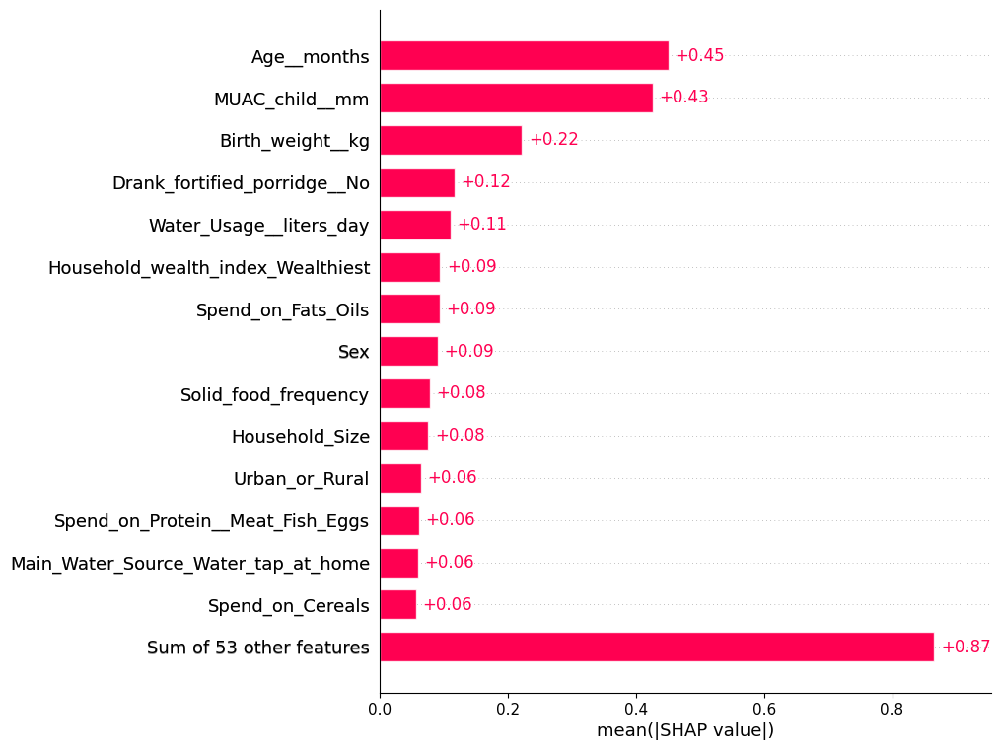

C:\Users\CTRL-SHIFT LTD\AppData\Local\Temp\ipykernel_1500\2430030159.py:14: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



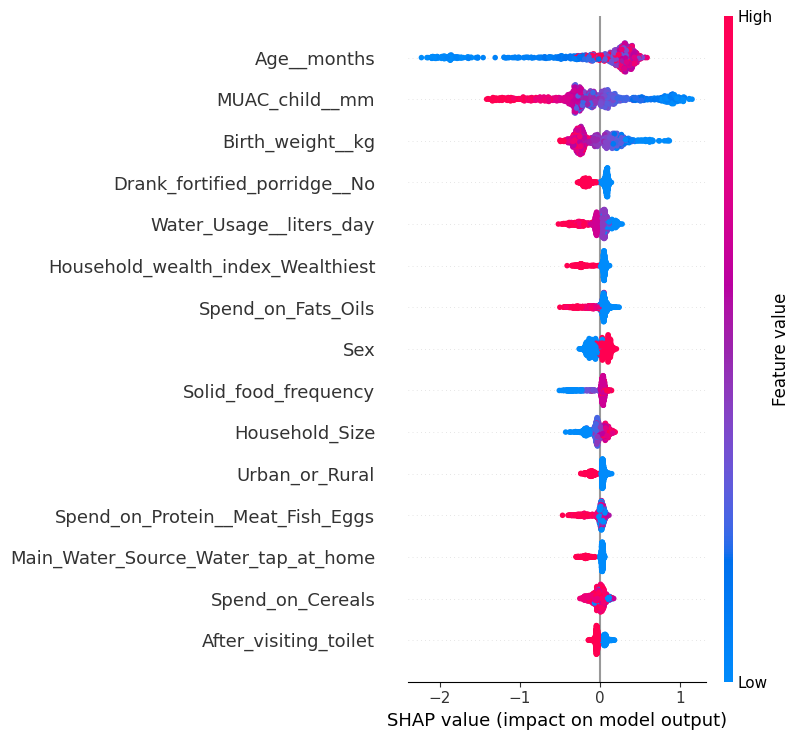

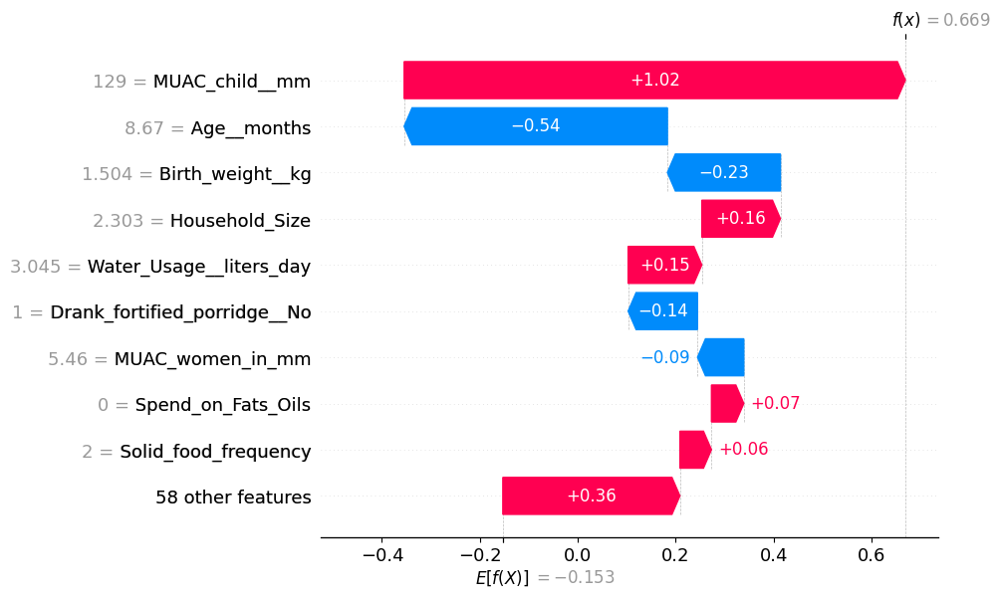

In [69]:
# Load CatBoost model correctly (your earlier code overwrote it)
from catboost import CatBoostClassifier

cat_model = joblib.load(os.path.join(model_dir, 'catboost_model.pkl'))

# SHAP for CatBoost
explainer_cat = shap.Explainer(cat_model)
shap_values_cat = explainer_cat(X_test)

# Global feature importance
shap.plots.bar(shap_values_cat, max_display=15)

# Beeswarm plot (feature value impact on prediction)
shap.summary_plot(shap_values_cat, X_test, max_display=15)

# Individual prediction explanation (e.g. for child 100)
shap.plots.waterfall(shap_values_cat[100])


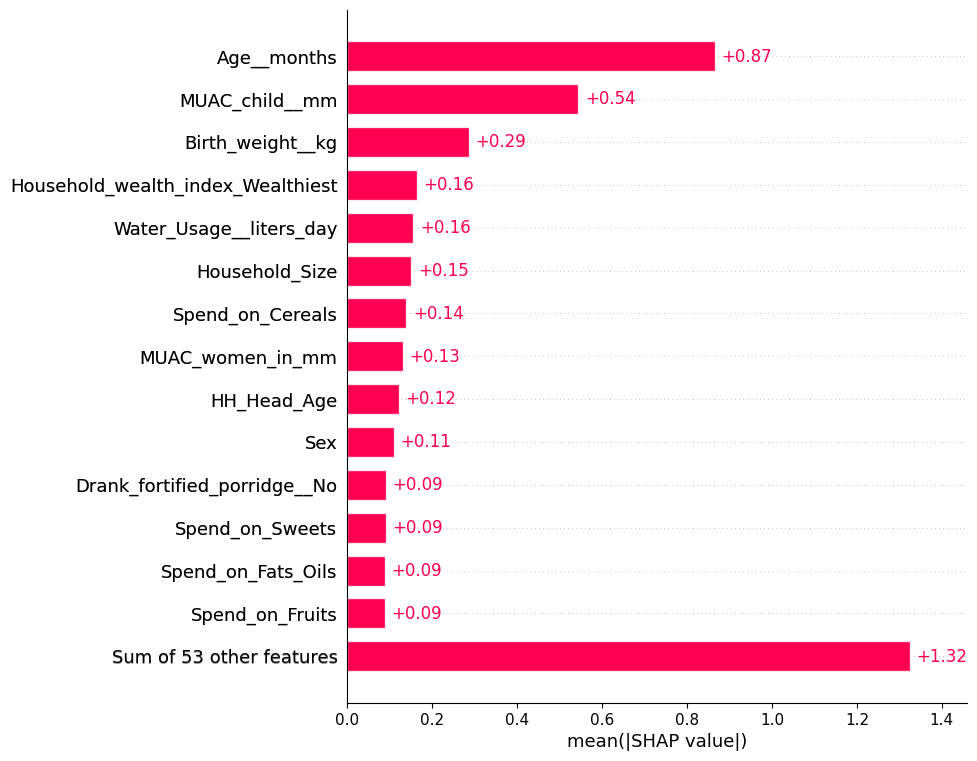

C:\Users\CTRL-SHIFT LTD\AppData\Local\Temp\ipykernel_1500\1601508501.py:6: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



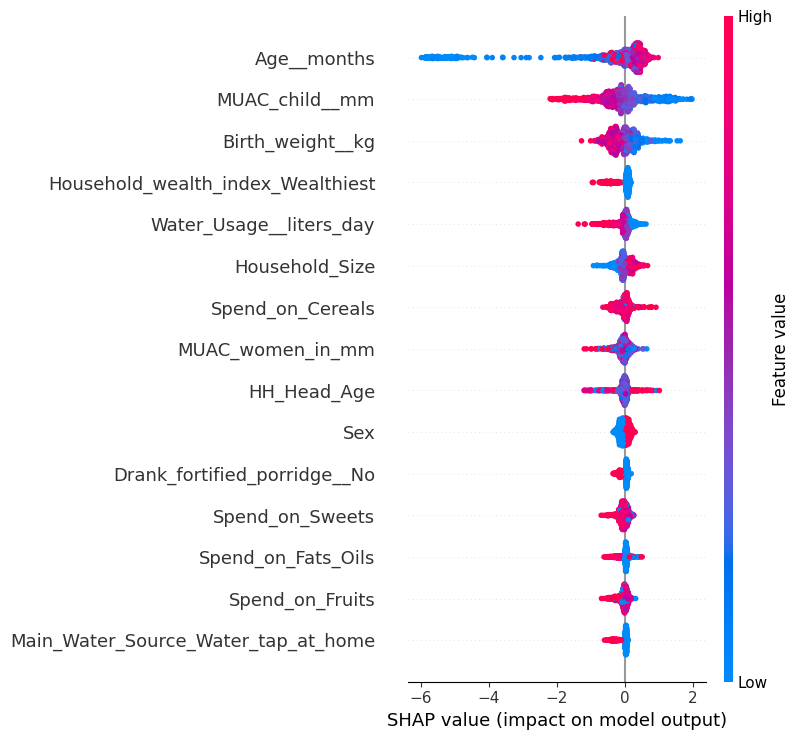

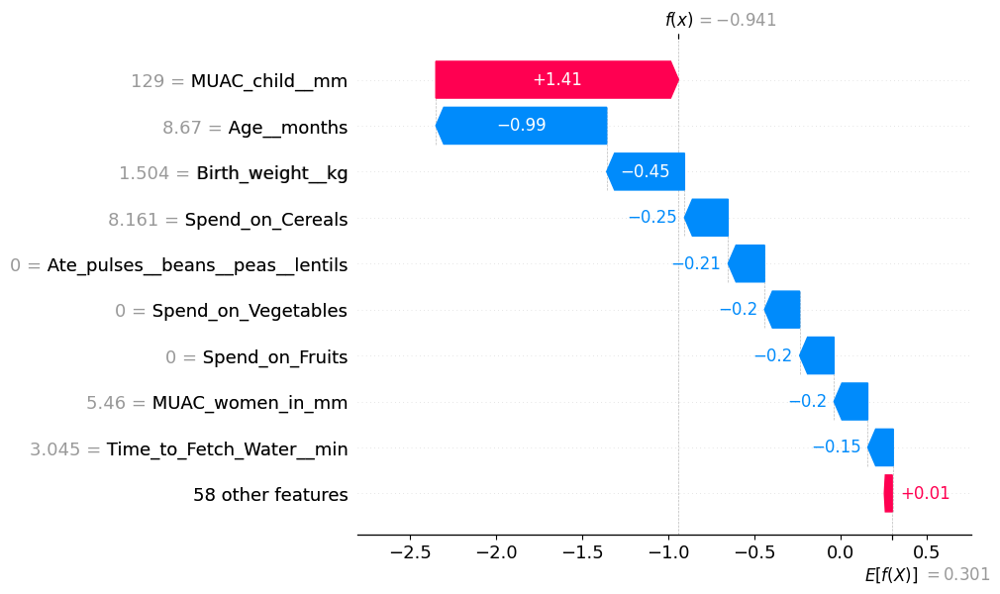

In [70]:
explainer_xgb = shap.Explainer(xgb_model)
shap_values_xgb = explainer_xgb(X_test_aligned)

# Global bar plot
shap.plots.bar(shap_values_xgb, max_display=15)
shap.summary_plot(shap_values_xgb, X_test_aligned, max_display=15)
shap.plots.waterfall(shap_values_xgb[100])


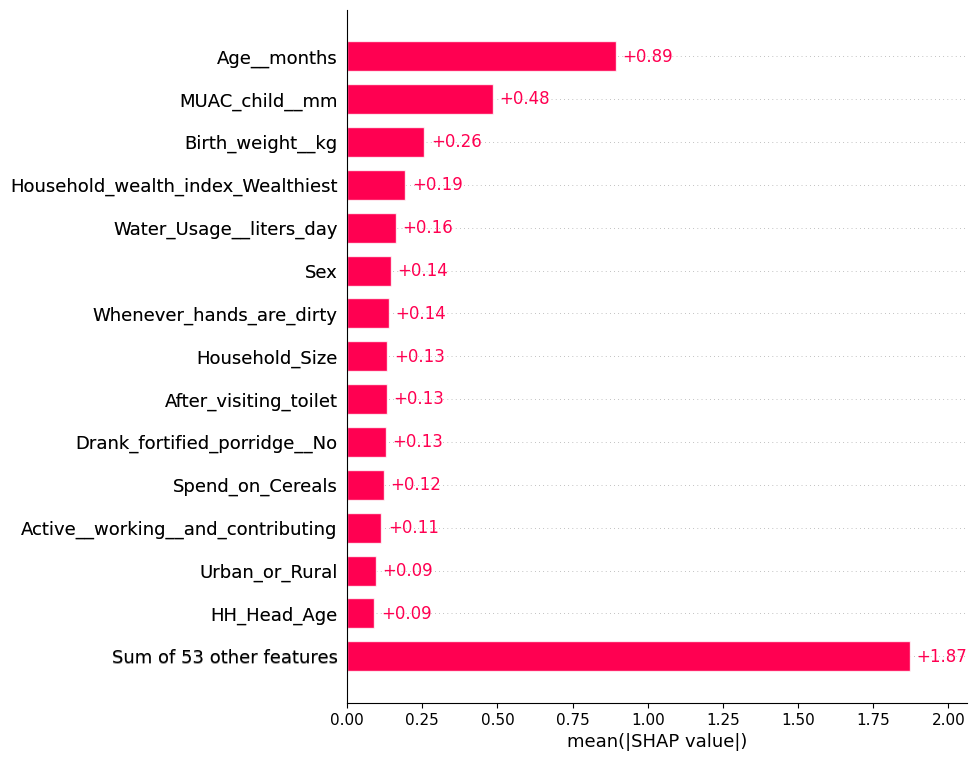

C:\Users\CTRL-SHIFT LTD\AppData\Local\Temp\ipykernel_1500\1368024488.py:6: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



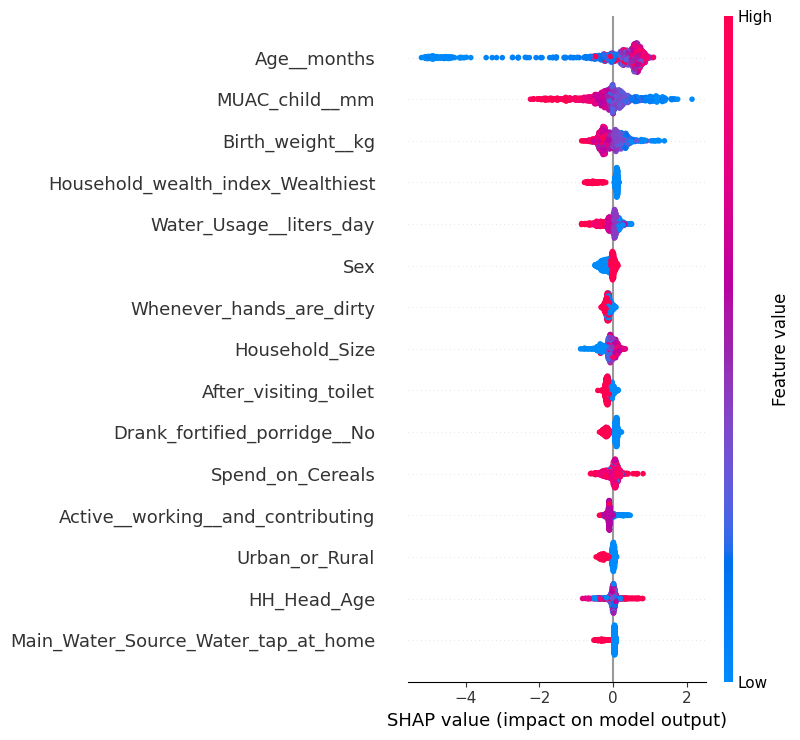

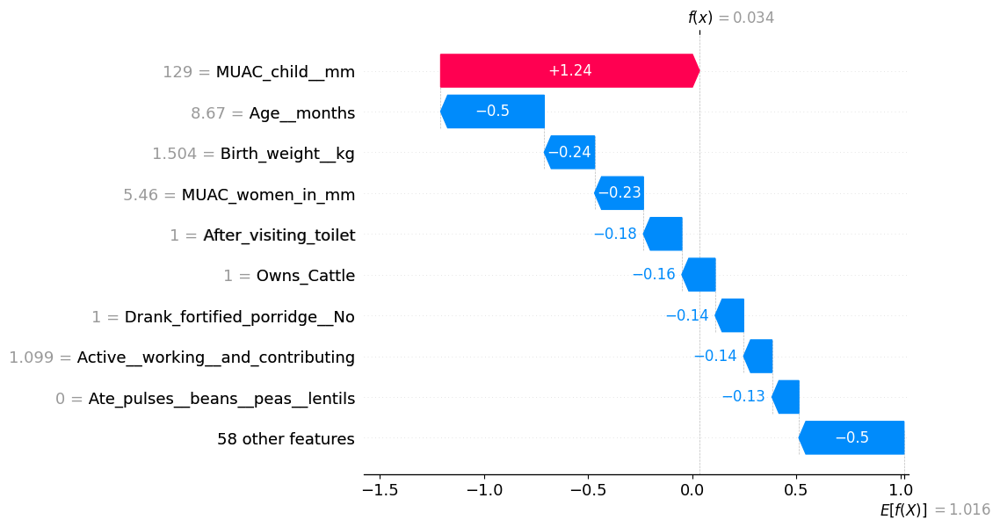

In [71]:
explainer_lgbm = shap.Explainer(lgbm)
shap_values_lgbm = explainer_lgbm(X_test_aligned)

# Global bar plot
shap.plots.bar(shap_values_lgbm, max_display=15)
shap.summary_plot(shap_values_lgbm, X_test_aligned, max_display=15)
shap.plots.waterfall(shap_values_lgbm[100])


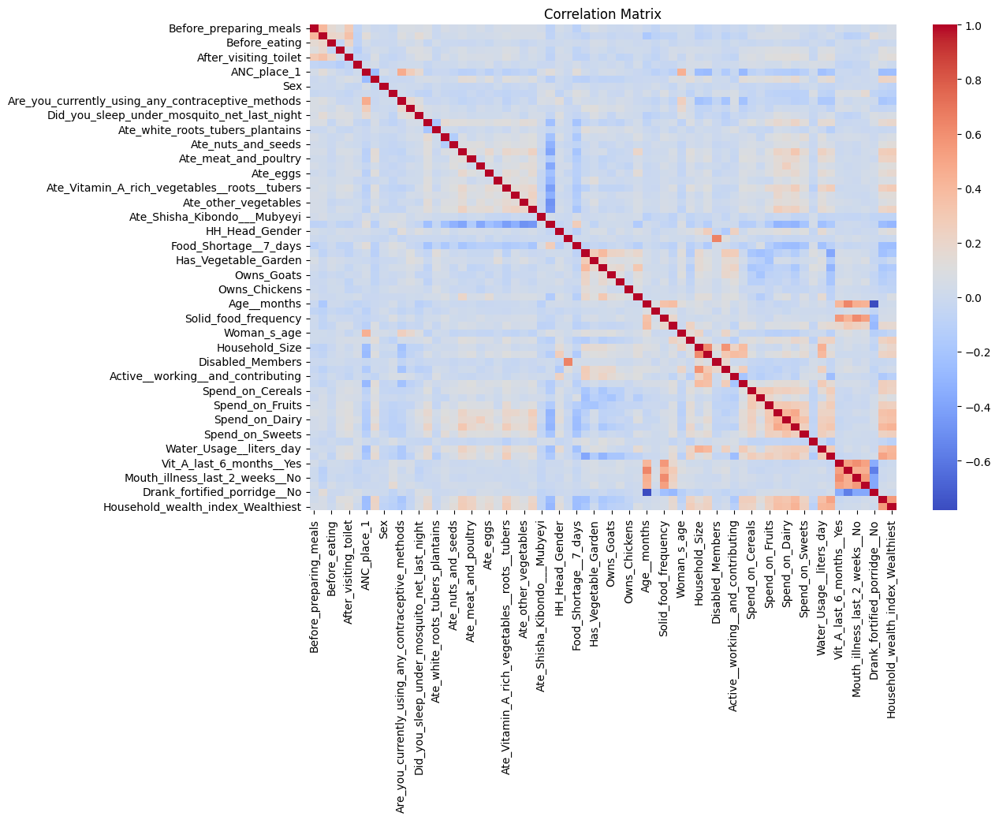

In [72]:
# Create a correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = pd.DataFrame(X_train_scaled, columns=expected_features).corr()

# Visualize
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()


### Why this logistic regression pipeline?
- **Remove duplicates & clean data**: Ensures no redundant features and avoids errors from missing or infinite values  
- **Align features and target**: Guarantees that inputs and outputs correspond correctly for modeling  
- **Add intercept and convert types**: Prepares data in the format required by the regression algorithm  
- **Fit model and summarize**: Builds the predictive model and provides insight into feature effects on the target  


In [73]:
import numpy as np
import pandas as pd
import statsmodels.api as sm


# 1. Drop duplicate columns (keep first occurrence)
df_model_clean = df_model.loc[:, ~df_model.columns.duplicated()]

# 2. Separate features and target
X = df_model_clean.drop(columns=['stunting_binary'])
y = df_model_clean['stunting_binary']

# 3. Align X and y by index, keeping only rows present in both
X_aligned, y_aligned = X.align(y, join='inner', axis=0)

# 4. Convert target to int type (binary 0/1)
y_aligned = y_aligned.astype(int)

# 5. Replace infinite values with NaN and drop rows with missing values
X_aligned = X_aligned.replace([np.inf, -np.inf], np.nan).dropna()
y_aligned = y_aligned.loc[X_aligned.index]  # Sync target index with X_aligned

# 6. Add constant term to predictors for intercept in logistic regression
X_with_const = sm.add_constant(X_aligned, has_constant='add')

# 7. Convert all nullable integer columns (pandas 'Int64') to float64 to avoid dtype errors
X_with_const = X_with_const.apply(lambda col: col.astype('float64') if col.dtype.name == 'Int64' else col)

# 8. Optionally convert all integer columns to float64 for consistency
X_with_const = X_with_const.astype(float)

# 9. Fit logistic regression model
logit_model = sm.Logit(y_aligned, X_with_const)
result = logit_model.fit()

# 10. Print model summary
print(result.summary())


Optimization terminated successfully.
         Current function value: 0.479270
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:        stunting_binary   No. Observations:                 5063
Model:                          Logit   Df Residuals:                     4995
Method:                           MLE   Df Model:                           67
Date:                Fri, 10 Oct 2025   Pseudo R-squ.:                  0.1611
Time:                        14:36:14   Log-Likelihood:                -2426.5
converged:                       True   LL-Null:                       -2892.6
Covariance Type:            nonrobust   LLR p-value:                1.506e-152
                                                               coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------
const           

In [74]:
# Find duplicate columns by comparing column content
duplicated_cols = X.columns[X.T.duplicated()]

print("Duplicate columns found:")
print(duplicated_cols.tolist())


Duplicate columns found:
[]


In [75]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
X_no_const = X_with_const.drop(columns='const')
vif_data = pd.DataFrame()
vif_data["feature"] = X_no_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_no_const.values, i) for i in range(X_no_const.shape[1])]

print(vif_data.sort_values(by="VIF", ascending=False))


                                              feature         VIF
43                                   MUAC_women_in_mm  575.945746
47                                        HH_Head_Age  337.776310
41                                     MUAC_child__mm  210.141735
44                                     Household_Size  101.659907
58                            Water_Usage__liters_day   89.128363
45                                     Active_Members   49.726190
48                  Active__working__and_contributing   32.098527
42                                        Woman_s_age   25.517350
50                                   Spend_on_Cereals   18.903038
62                     Mouth_illness_last_2_weeks__No   15.111057
56                                    Spend_on_Sweets   13.786167
38                                        Age__months   13.674971
6                                         ANC_place_1   12.995540
57                           Time_to_Fetch_Water__min   12.763989
60        

### Summary:
Dropped variables with very high Variance Inflation Factor (VIF) to reduce multicollinearity.  
This helps improve model stability and the interpretability of regression coefficients.


In [76]:
X_with_const = X_with_const.drop(columns=[
    'MUAC_women_in_mm',
    'MUAC_child__mm',
    'HH_Head_Age',
    'Household_Size',
    'Water_Usage__liters_day',
    'Active_Members'
], errors='ignore')

X_with_const = X_with_const.drop(columns=[
    'Active__working__and_contributing',
    'Woman_s_age',
    'Spend_on_Cereals'
], errors='ignore')


In [77]:
logit_model = sm.Logit(y_aligned, X_with_const)
result = logit_model.fit()
print(result.summary())


Optimization terminated successfully.
         Current function value: 0.512235
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:        stunting_binary   No. Observations:                 5063
Model:                          Logit   Df Residuals:                     5004
Method:                           MLE   Df Model:                           58
Date:                Fri, 10 Oct 2025   Pseudo R-squ.:                  0.1034
Time:                        14:36:24   Log-Likelihood:                -2593.4
converged:                       True   LL-Null:                       -2892.6
Covariance Type:            nonrobust   LLR p-value:                 9.306e-91
                                                               coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------
const           

### 📈 Odds Ratio Summary:
- Calculate odds ratios and 95% CI from model coefficients  
- Combine and sort results by odds ratio to ort results to identify strongest predictorsrs



In [78]:
import numpy as np

odds_ratios = np.exp(result.params)
conf = np.exp(result.conf_int())
conf.columns = ['2.5%', '97.5%']
odds_summary = pd.concat([odds_ratios, conf], axis=1)
odds_summary.columns = ['Odds Ratio', 'CI Lower', 'CI Upper']
print(odds_summary.sort_values(by='Odds Ratio', ascending=False))


                                                    Odds Ratio  CI Lower  \
Mouth_illness_last_2_weeks__No                        1.849906  1.342733   
Vit_A_last_6_months__Yes                              1.430093  1.098537   
Hands_washed_before_meal__Yes                         1.380977  1.105390   
Disabled_Members                                      1.360016  0.870047   
Sex                                                   1.348898  1.178890   
Other_times                                           1.294154  0.895496   
Solid_food_frequency                                  1.288572  1.150610   
Before_eating                                         1.211849  0.998807   
Minimum_Dietary_Diversity___Women                     1.174048  0.918189   
ANC_place_2                                           1.167365  0.614308   
Ate_dark_green_leafy_vegetables                       1.148023  0.966650   
Dewormed_last_6_months__Yes                           1.147141  0.931998   
Owns_Farming